In [ ]:
!pip install mlforecast tsaug statsforecast neuralforecast catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.6/354.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.2/263.2 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.7/280.7 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.5/849.5 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# **Common code processes**

In [ ]:
# @title
import numpy as np
import pandas as pd

import scipy.stats as stats

import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_wide = pd.read_csv('/content/drive/MyDrive/AI_Data/Data_Augmentation/test_cpi.csv')
df_long = df_wide.melt(id_vars='Chi tieu', var_name='ds', value_name='y')
df_long.rename(columns={'Chi tieu': 'unique_id'}, inplace=True)
df_long['ds'] = pd.to_datetime(df_long['ds'], format='%m-%Y')
df_long.dropna(subset=['y'], inplace=True)
df_long = df_long.sort_values(['unique_id', 'ds'])
df_long = df_long[df_long['unique_id'] == 'Chi so gia tieu dung']

features_df = pd.read_csv('/content/drive/MyDrive/AI_Data/Features.csv')
rename_map = {
    'Date': 'Date',
    'Oild Price (USD)': 'Oil_Price',
    'Tin dung (Ty VND)': 'Credit',
    'M2 (Ty VND)': 'M2',
    'Nhap khau xang dau (Trieu USD)': 'Fuel_Import_Val',
    'Tong gia tri nhap khau (Trieu USD)': 'Total_Import',
    'Tong muc ban le (Ty VND)': 'Retail',
    'Giai ngan FDI (Ty USD)': 'FDI',
    'Ty gia USD-VND (VND)': 'ExRate'
}
features_df.rename(columns=rename_map, inplace=True)

features_df['Date'] = pd.to_datetime(features_df['Date'], format='%m/%d/%Y')
features_df = features_df.sort_values('Date').reset_index(drop=True)

numeric_cols = ['Oil_Price', 'Credit', 'M2', 'Fuel_Import_Val',
                'Total_Import', 'Retail', 'FDI', 'ExRate']

for col in numeric_cols:
    features_df[col] = features_df[col].astype(str).str.replace(',', '', regex=False)
    features_df[col] = pd.to_numeric(features_df[col], errors='coerce')

features_df['Fuel_Import_Vol_Est'] = features_df['Fuel_Import_Val'] / features_df['Oil_Price']

features_df['M2_Growth_YoY'] = features_df['M2'].pct_change(periods=12) * 100
features_df['Credit_Growth_YoY'] = features_df['Credit'].pct_change(periods=12) * 100
features_df['Retail_Growth_YoY'] = features_df['Retail'].pct_change(periods=12) * 100
features_df['Total_Import_Growth_YoY'] = features_df['Total_Import'].pct_change(periods=12) * 100

features_df['Oil_Price_MoM'] = features_df['Oil_Price'].pct_change(periods=1) * 100
features_df['ExRate_MoM'] = features_df['ExRate'].pct_change(periods=1) * 100

lags = [1, 2, 3, 6, 12]
exog_vars_to_lag = ['M2_Growth_YoY', 'Credit_Growth_YoY', 'Oil_Price_MoM']

for col in exog_vars_to_lag:
    for lag in lags:
        new_col_name = f'{col}_lag{lag}'
        features_df[new_col_name] = features_df[col].shift(lag)

features_df['M2'] = features_df['M2'].astype(np.float64)

df_long = pd.merge(df_long, features_df, left_on='ds', right_on='Date', how='left')
df_long = df_long.drop('Date', axis=1)

vars_missing_lags = ['Retail_Growth_YoY', 'Total_Import_Growth_YoY', 'ExRate_MoM', 'FDI', 'Fuel_Import_Vol_Est']

for col in vars_missing_lags:
    if col in df_long.columns:
        df_long[f'{col}_lag1'] = df_long[col].shift(1)

keep_cols = [
    'unique_id',
    'ds',
    'y',
    'M2_Growth_YoY_lag1', 'M2_Growth_YoY_lag2', 'M2_Growth_YoY_lag3', 'M2_Growth_YoY_lag6', 'M2_Growth_YoY_lag12',
    'Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Credit_Growth_YoY_lag12',
    'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Oil_Price_MoM_lag3', 'Oil_Price_MoM_lag6', 'Oil_Price_MoM_lag12',
    'Retail_Growth_YoY_lag1',
    'Total_Import_Growth_YoY_lag1',
    'ExRate_MoM_lag1',
    'FDI_lag1',
    'Fuel_Import_Vol_Est_lag1'
]

final_cols = [c for c in keep_cols if c in df_long.columns]
df_final = df_long[final_cols].copy()

Y_train_df = df_final[df_final.ds<='2024-06-01']
Y_test_df = df_final[df_final.ds>'2024-06-01']
Y_train_df.reset_index(drop=True, inplace=True)
Y_test_df.reset_index(drop=True, inplace=True)

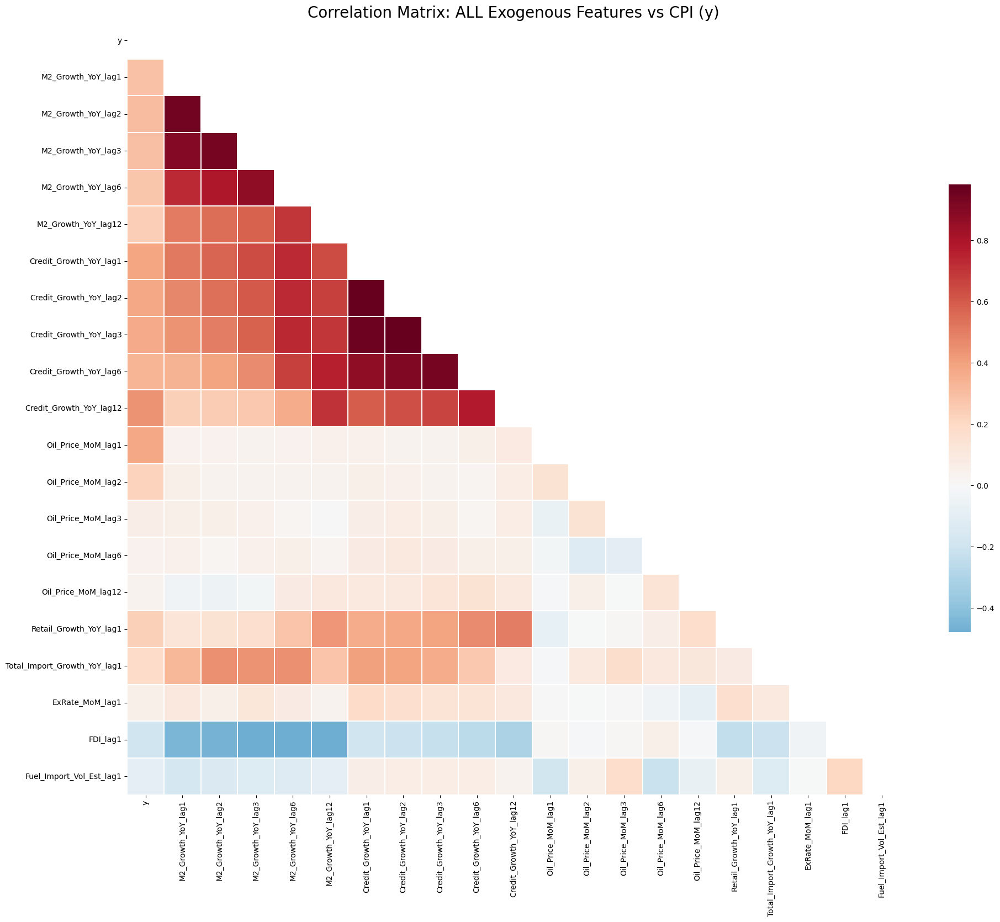


TOP CÁC BIẾN TƯƠNG QUAN MẠNH NHẤT VỚI CPI (y)
Credit_Growth_YoY_lag12         0.443203
Credit_Growth_YoY_lag1          0.386232
Credit_Growth_YoY_lag2          0.379834
Oil_Price_MoM_lag1              0.379330
Credit_Growth_YoY_lag3          0.372678
Credit_Growth_YoY_lag6          0.332889
M2_Growth_YoY_lag2              0.300248
M2_Growth_YoY_lag3              0.292799
M2_Growth_YoY_lag1              0.286635
M2_Growth_YoY_lag6              0.271196
M2_Growth_YoY_lag12             0.241538
Retail_Growth_YoY_lag1          0.237527
Oil_Price_MoM_lag2              0.223647
Total_Import_Growth_YoY_lag1    0.189309
FDI_lag1                       -0.188030
Fuel_Import_Vol_Est_lag1       -0.094288
Oil_Price_MoM_lag3              0.063755
ExRate_MoM_lag1                 0.053106
Oil_Price_MoM_lag6              0.045884
Oil_Price_MoM_lag12             0.032099
Name: y, dtype: float64

CÁC BIẾN ÍT TƯƠNG QUAN NHẤT (CÓ THỂ LOẠI BỎ)
M2_Growth_YoY_lag12             0.241538
Retail_Growth_YoY_lag1

In [ ]:
# @title
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

cols_to_drop = ['unique_id', 'ds', 'Date', 'month', 'year']

numeric_cols = [c for c in df_final.columns if c not in cols_to_drop]

if 'y' in numeric_cols:
    numeric_cols.remove('y')
    numeric_cols = ['y'] + numeric_cols

df_corr_all = df_final[numeric_cols].dropna()

corr_matrix_all = df_corr_all.corr(method='pearson')

plt.figure(figsize=(20, 18))

mask = np.triu(np.ones_like(corr_matrix_all, dtype=bool))

sns.heatmap(corr_matrix_all,
            mask=mask,
            annot=False,
            fmt=".2f",
            cmap='RdBu_r',
            center=0,
            linewidths=0.1,
            square=True,
            cbar_kws={"shrink": 0.5})

plt.title('Correlation Matrix: ALL Exogenous Features vs CPI (y)', fontsize=20)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("\n" + "="*50)
print("TOP VARIABLES WITH THE STRONGEST CORRELATION TO CPI (y)")
print("="*50)

target_corr = corr_matrix_all['y'].drop('y') # Bỏ chính nó ra
target_corr_abs = target_corr.abs().sort_values(ascending=False)

print(target_corr.loc[target_corr_abs.index].head(20))

print("\n" + "="*50)
print("LEAST CORRELATED VARIABLES")
print("="*50)
print(target_corr.loc[target_corr_abs.index].tail(10))

**Exogenous features - 6 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag1',
    'Credit_Growth_YoY_lag12',
    'Oil_Price_MoM_lag1',
    'Oil_Price_MoM_lag2',
    'Retail_Growth_YoY_lag1',
    'Total_Import_Growth_YoY_lag1'
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()

**Exogenous features - 7 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag1',
    'Credit_Growth_YoY_lag12',
    'Credit_Growth_YoY_lag2',
    'Credit_Growth_YoY_lag3',
    'Credit_Growth_YoY_lag6',
    'Oil_Price_MoM_lag1',
    'M2_Growth_YoY_lag2'
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()

**Exogenous features - 5 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag1',
    'Credit_Growth_YoY_lag12',
    'Credit_Growth_YoY_lag2',
    'Credit_Growth_YoY_lag3',
    'Oil_Price_MoM_lag1',
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()

**Exogenous features - 2 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag1',
    'Credit_Growth_YoY_lag12',
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()

**Exogenous features - 1 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag12'
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()


**Exogenous features - 8 features**

In [ ]:
# @title
elite_features = [
    'unique_id',
    'ds',
    'y',
    'Credit_Growth_YoY_lag1',
    'Credit_Growth_YoY_lag12',
    'Credit_Growth_YoY_lag6',
    'M2_Growth_YoY_lag2',
    'Oil_Price_MoM_lag1',
    'Oil_Price_MoM_lag2',
    'Retail_Growth_YoY_lag1',
    'Total_Import_Growth_YoY_lag1'
]

df_train_elite = Y_train_df[elite_features].copy()
df_test_elite = Y_test_df[elite_features].copy()

In [ ]:
df_test_elite

,unique_id,ds,y,Credit_Growth_YoY_lag1,Credit_Growth_YoY_lag12,Credit_Growth_YoY_lag6,M2_Growth_YoY_lag2,Oil_Price_MoM_lag1,Oil_Price_MoM_lag2,Retail_Growth_YoY_lag1,Total_Import_Growth_YoY_lag1
0,Chi so gia tieu dung,2024-07-01,0.48,15.281573,8.963770,12.897799,11.105136,4.795956,-6.046566,3.332536,12.879072
1,Chi so gia tieu dung,2024-08-01,0.00,15.298661,9.603584,11.984116,11.921233,-4.894118,4.795956,3.146981,22.775154
2,Chi so gia tieu dung,2024-09-01,0.29,15.674685,9.979545,12.505942,12.024185,-4.836714,-4.894118,2.167079,15.793345
3,Chi so gia tieu dung,2024-10-01,0.33,16.079557,9.877917,12.673437,12.547258,-6.707396,-4.836714,2.130806,9.059066
4,Chi so gia tieu dung,2024-11-01,0.13,16.685094,11.302964,13.967367,12.798206,1.449073,-6.707396,1.753337,14.640055
5,Chi so gia tieu dung,2024-12-01,0.29,16.564604,13.791383,15.281573,13.486941,-1.332235,1.449073,1.682640,9.620805
6,Chi so gia tieu dung,2025-01-01,0.98,15.087620,12.897799,15.298661,12.685352,3.897550,-1.332235,0.874536,14.283382
7,Chi so gia tieu dung,2025-02-01,0.34,16.516279,11.984116,15.674685,11.973344,2.840300,3.897550,9.866900,-1.923328
8,Chi so gia tieu dung,2025-03-01,-0.03,16.840081,12.505942,16.079557,13.610808,-5.145909,2.840300,10.164390,37.686678
9,Chi so gia tieu dung,2025-04-01,0.07,17.912707,12.673437,16.685094,14.095228,2.650735,-5.145909,11.050965,18.646396


In [ ]:
df_train_elite

,unique_id,ds,y,Credit_Growth_YoY_lag1,Credit_Growth_YoY_lag12,Oil_Price_MoM_lag1,Oil_Price_MoM_lag2,Retail_Growth_YoY_lag1,Total_Import_Growth_YoY_lag1
0,Chi so gia tieu dung,2009-01-01,0.32,NaN,NaN,-14.769116,-18.110839,NaN,NaN
1,Chi so gia tieu dung,2009-02-01,1.17,20.789982,NaN,0.636104,-14.769116,NaN,NaN
2,Chi so gia tieu dung,2009-03-01,-0.17,21.149971,NaN,1.024412,0.636104,NaN,NaN
3,Chi so gia tieu dung,2009-04-01,0.35,24.169995,NaN,6.213592,1.024412,NaN,NaN
4,Chi so gia tieu dung,2009-05-01,0.44,25.269976,NaN,3.189112,6.213592,NaN,NaN
5,Chi so gia tieu dung,2009-06-01,0.55,28.130031,NaN,28.976378,3.189112,NaN,NaN
6,Chi so gia tieu dung,2009-07-01,0.52,31.110015,NaN,5.769231,28.976378,NaN,NaN
7,Chi so gia tieu dung,2009-08-01,0.24,36.210026,NaN,3.463203,5.769231,NaN,NaN
8,Chi so gia tieu dung,2009-09-01,0.62,38.819973,NaN,-2.859135,3.463203,NaN,NaN
9,Chi so gia tieu dung,2009-10-01,0.37,43.609981,NaN,-0.832735,-2.859135,NaN,NaN


In [ ]:
full_data = pd.concat([df_train_elite, df_test_elite], ignore_index=True)

In [ ]:
full_data.head(1)

,unique_id,ds,y,Credit_Growth_YoY_lag1,Credit_Growth_YoY_lag12,Oil_Price_MoM_lag1,Oil_Price_MoM_lag2,Retail_Growth_YoY_lag1,Total_Import_Growth_YoY_lag1
0,Chi so gia tieu dung,2009-01-01,0.32,NaN,NaN,-14.769116,-18.110839,NaN,NaN


# **LightGBM with Original Data - All cases**

In [ ]:
import pandas as pd
import lightgbm as lgb
import optuna

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler
import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lgb_df = pd.DataFrame()
metric_loss_lgb_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  lgbm_model_params = {
        'learning_rate': 0.09,
        'n_estimators': 100,
        'num_leaves': 32,
        'max_depth': -1,
        'reg_lambda': 0.1,
        'reg_alpha': 0.3,
        'min_child_samples': 20,
        'subsample': 1.0,
        'colsample_bytree': 1.0,
        'num_threads': -1,
        'verbose': -1,
        'random_state': 42
    }
  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_lgb = MLForecast(
    models=[lgb.LGBMRegressor(**lgbm_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_lgb_df = final_model_lgb.preprocess(df=df_train_elite, static_features=[], dropna=False)
  prep_lgb_df.dropna(inplace=True)
  prep_lgb_df.reset_index(drop=True, inplace=True)
  y_train_lgb = prep_lgb_df['y']
  X_train_lgb = prep_lgb_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lgb.fit_models(X_train_lgb,y_train_lgb)
  predictions = []

  for i in range(len(df_test_elite)):
    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lgb.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]

    result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'LGBMRegressor': pred['LGBMRegressor'].iloc[0]
    }
    predictions.append(result_row)
  lgb_results_df = pd.DataFrame(predictions)
  lgb_evaluation_results = evaluate(
    lgb_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  lgb_results_df['scaler_type'] = scaler_name
  lgb_evaluation_results['scaler_type'] = scaler_name
  prediction_lgb_df = pd.concat([prediction_lgb_df, lgb_results_df], ignore_index=True)
  metric_loss_lgb_df = pd.concat([metric_loss_lgb_df, lgb_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.261399,None
1,Chi so gia tieu dung,rmse,0.330933,None
2,Chi so gia tieu dung,mse,0.109517,None
3,Chi so gia tieu dung,mae,0.228938,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.281378,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.079174,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.204495,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.250767,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062884,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.246558,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.250889,None
1,Chi so gia tieu dung,rmse,0.277580,None
2,Chi so gia tieu dung,mse,0.077051,None
3,Chi so gia tieu dung,mae,0.227570,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.282955,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.080064,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.193657,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.250570,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062785,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.209989,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.243477,None
1,Chi so gia tieu dung,rmse,0.293690,None
2,Chi so gia tieu dung,mse,0.086254,None
3,Chi so gia tieu dung,mae,0.230837,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.282376,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.079736,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.196971,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.251306,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.063155,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.220361,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.228244,None
1,Chi so gia tieu dung,rmse,0.297159,None
2,Chi so gia tieu dung,mse,0.088303,None
3,Chi so gia tieu dung,mae,0.232833,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.288815,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.083414,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.205741,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.260411,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.067814,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.220913,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.245139,None
1,Chi so gia tieu dung,rmse,0.295381,None
2,Chi so gia tieu dung,mse,0.087250,None
3,Chi so gia tieu dung,mae,0.242009,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.314579,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.098960,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.196640,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.257197,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.066150,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.235479,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lgb.ts.features_order_)
metric_loss_lgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.245158,None
1,Chi so gia tieu dung,rmse,0.303834,None
2,Chi so gia tieu dung,mse,0.092315,None
3,Chi so gia tieu dung,mae,0.225693,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.280038,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.078421,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.194142,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.244571,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.059815,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.235567,LocalRobustScaler('iqr')


# **XGBoost with Original Data - All cases**

In [ ]:
import pandas as pd
import xgboost as xgb

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.losses import mae, mse
from utilsforecast.plotting import plot_series

prediction_xgb_df = pd.DataFrame()
metric_loss_xgb_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  xgb_model_params = {'n_estimators': 100,
                    'max_depth': 0,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'colsample_bytree': 1.0,
                    'reg_lambda': 0.1,
                    'reg_alpha': 0.3,
                    'min_child_weight': 20,
                    'booster': 'gbtree',
                    'random_state': 42}

  mlf_init_params = {
            'lags': [1,2,3,6,12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_xgb = MLForecast(
    models=[xgb.XGBRegressor(**xgb_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_xgb_df = final_model_xgb.preprocess(df=df_train_elite, static_features=[], dropna=False)
  prep_xgb_df.dropna(inplace=True)
  prep_xgb_df.reset_index(drop=True, inplace=True)
  y_train_xgb = prep_xgb_df['y']
  X_train_xgb = prep_xgb_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_xgb.fit_models(X_train_xgb,y_train_xgb)
  predictions = []

  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i

    # Đảm bảo start_index không bị âm
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    #print(current_history_window)
    # Dự báo 1 bước
    pred = final_model_xgb.predict(h=1, new_df=current_history_window, X_df=future_exog)

    # Lấy ra giá trị thực tế để so sánh
    actual_row = df_test_elite.iloc[i]
    #print(actual_row)

    # Lưu kết quả
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'XGBRegressor': pred['XGBRegressor'].iloc[0]
    }
    predictions.append(result_row)
  xgb_results_df = pd.DataFrame(predictions)

  xgb_evaluation_results = evaluate(
    xgb_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  xgb_results_df['scaler_type'] = scaler_name
  xgb_evaluation_results['scaler_type'] = scaler_name
  prediction_xgb_df = pd.concat([prediction_xgb_df, xgb_results_df], ignore_index=True)
  metric_loss_xgb_df = pd.concat([metric_loss_xgb_df, xgb_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.257686,None
1,Chi so gia tieu dung,rmse,0.321615,None
2,Chi so gia tieu dung,mse,0.103436,None
3,Chi so gia tieu dung,mae,0.228032,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.290169,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.084198,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.198183,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.249538,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062269,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.233738,LocalRobustScaler('iqr')


In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.211852,None
1,Chi so gia tieu dung,rmse,0.256185,None
2,Chi so gia tieu dung,mse,0.065631,None
3,Chi so gia tieu dung,mae,0.208319,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.266008,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.070760,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.190776,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.249121,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062061,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.195106,LocalRobustScaler('iqr')


In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.234239,None
1,Chi so gia tieu dung,rmse,0.308043,None
2,Chi so gia tieu dung,mse,0.094890,None
3,Chi so gia tieu dung,mae,0.216435,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.263916,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.069651,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.198266,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.252793,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.063905,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.217097,LocalRobustScaler('iqr')


In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.232876,None
1,Chi so gia tieu dung,rmse,0.301614,None
2,Chi so gia tieu dung,mse,0.090971,None
3,Chi so gia tieu dung,mae,0.223128,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.286259,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.081944,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.205320,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.261717,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.068496,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.232490,LocalRobustScaler('iqr')


In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.260399,None
1,Chi so gia tieu dung,rmse,0.316846,None
2,Chi so gia tieu dung,mse,0.100391,None
3,Chi so gia tieu dung,mae,0.240653,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.315293,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.099410,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.195940,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.260765,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.067998,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.236920,LocalRobustScaler('iqr')


In [ ]:
print(final_model_xgb.ts.features_order_)
metric_loss_xgb_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.245267,None
1,Chi so gia tieu dung,rmse,0.322209,None
2,Chi so gia tieu dung,mse,0.103819,None
3,Chi so gia tieu dung,mae,0.222225,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.279171,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.077937,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.188305,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.238253,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.056764,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.220448,LocalRobustScaler('iqr')


# **RandomForest with Original Data - All cases**

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import  LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.losses import mae, mse
from utilsforecast.plotting import plot_series

prediction_rf_df = pd.DataFrame()
metric_loss_rf_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    rf_model_params = {
        'n_estimators': 100,
        'max_depth': None,
        'max_samples': 1.0,
        'max_features': max_feature,
        'verbose': 0,
        'random_state': 42,
    }
    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

    final_model_rf = MLForecast(
      models=[RandomForestRegressor(**rf_model_params)],
      freq='MS',
      **mlf_init_params,
    )
    prep_rf_df = final_model_rf.preprocess(df=df_train_elite, static_features=[], dropna=False)
    prep_rf_df.dropna(inplace=True)
    prep_rf_df.reset_index(drop=True, inplace=True)
    y_train_rf = prep_rf_df['y']
    X_train_rf = prep_rf_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_rf.fit_models(X_train_rf,y_train_rf)
    predictions = []
    #full_data = pd.concat([df_train_elite, df_test_elite], ignore_index=True)

    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_rf.predict(h=1, new_df=current_history_window, X_df=future_exog)

      actual_row = df_test_elite.iloc[i]

      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'RandomForestRegressor': pred['RandomForestRegressor'].iloc[0]
      }
      predictions.append(result_row)
    rf_results_df = pd.DataFrame(predictions)

    rf_evaluation_results = evaluate(
    rf_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    rf_results_df['scaler_type'] = scaler_name
    rf_results_df['config'] = max_feature
    rf_evaluation_results['scaler_type'] = scaler_name
    rf_evaluation_results['config'] = max_feature
    prediction_rf_df = pd.concat([prediction_rf_df, rf_results_df], ignore_index=True)
    metric_loss_rf_df = pd.concat([metric_loss_rf_df, rf_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.202033,None,1.0
1,Chi so gia tieu dung,rmse,0.242627,None,1.0
2,Chi so gia tieu dung,mse,0.058868,None,1.0
3,Chi so gia tieu dung,mae,0.200325,None,sqrt
4,Chi so gia tieu dung,rmse,0.232460,None,sqrt
5,Chi so gia tieu dung,mse,0.054038,None,sqrt
6,Chi so gia tieu dung,mae,0.200747,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.241873,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.058503,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.199722,LocalStandardScaler,sqrt


In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.179417,None,1.0
1,Chi so gia tieu dung,rmse,0.219049,None,1.0
2,Chi so gia tieu dung,mse,0.047983,None,1.0
3,Chi so gia tieu dung,mae,0.161575,None,sqrt
4,Chi so gia tieu dung,rmse,0.193216,None,sqrt
5,Chi so gia tieu dung,mse,0.037332,None,sqrt
6,Chi so gia tieu dung,mae,0.198000,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.246680,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.060851,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.189096,LocalStandardScaler,sqrt


In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.166858,None,1.0
1,Chi so gia tieu dung,rmse,0.204635,None,1.0
2,Chi so gia tieu dung,mse,0.041875,None,1.0
3,Chi so gia tieu dung,mae,0.186283,None,sqrt
4,Chi so gia tieu dung,rmse,0.217763,None,sqrt
5,Chi so gia tieu dung,mse,0.047421,None,sqrt
6,Chi so gia tieu dung,mae,0.191525,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.237663,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.056484,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.191134,LocalStandardScaler,sqrt


In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.199350,None,1.0
1,Chi so gia tieu dung,rmse,0.223980,None,1.0
2,Chi so gia tieu dung,mse,0.050167,None,1.0
3,Chi so gia tieu dung,mae,0.172883,None,sqrt
4,Chi so gia tieu dung,rmse,0.207784,None,sqrt
5,Chi so gia tieu dung,mse,0.043174,None,sqrt
6,Chi so gia tieu dung,mae,0.207156,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.262430,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.068870,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.196397,LocalStandardScaler,sqrt


In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.195533,None,1.0
1,Chi so gia tieu dung,rmse,0.228251,None,1.0
2,Chi so gia tieu dung,mse,0.052099,None,1.0
3,Chi so gia tieu dung,mae,0.160292,None,sqrt
4,Chi so gia tieu dung,rmse,0.190345,None,sqrt
5,Chi so gia tieu dung,mse,0.036231,None,sqrt
6,Chi so gia tieu dung,mae,0.210908,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.262200,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.068749,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.205248,LocalStandardScaler,sqrt


In [ ]:
print(final_model_rf.ts.features_order_)
metric_loss_rf_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.194792,None,1.0
1,Chi so gia tieu dung,rmse,0.231875,None,1.0
2,Chi so gia tieu dung,mse,0.053766,None,1.0
3,Chi so gia tieu dung,mae,0.175250,None,sqrt
4,Chi so gia tieu dung,rmse,0.195637,None,sqrt
5,Chi so gia tieu dung,mse,0.038274,None,sqrt
6,Chi so gia tieu dung,mae,0.198236,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.239286,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.057258,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.200322,LocalStandardScaler,sqrt


# **DecisionTree with Original Data - All cases**

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
import optuna

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalRobustScaler, LocalMinMaxScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.losses import mae, mse

prediction_dtr_df = pd.DataFrame()
metric_loss_dtr_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    dtr_model_params = {
        'max_depth': None,
        'max_features': max_feature,
        'random_state': 42
    }
    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

    final_model_dtr = MLForecast(
      models=[DecisionTreeRegressor(**dtr_model_params)],
      freq='MS',
      **mlf_init_params,
    )

    prep_dtr_df = final_model_dtr.preprocess(df=df_train_elite, static_features=[], dropna=False)
    prep_dtr_df.dropna(inplace=True)
    prep_dtr_df.reset_index(drop=True, inplace=True)
    y_train_dtr = prep_dtr_df['y']
    X_train_dtr = prep_dtr_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_dtr.fit_models(X_train_dtr,y_train_dtr)
    predictions = []
    #full_data = pd.concat([df_train_elite, df_test_elite], ignore_index=True)

    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_dtr.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'DecisionTreeRegressor': pred['DecisionTreeRegressor'].iloc[0]
      }
      predictions.append(result_row)
    dtr_results_df = pd.DataFrame(predictions)

    dtr_evaluation_results = evaluate(
      dtr_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    dtr_results_df['scaler_type'] = scaler_name
    dtr_results_df['config'] = max_feature
    dtr_evaluation_results['scaler_type'] = scaler_name
    dtr_evaluation_results['config'] = max_feature
    prediction_dtr_df = pd.concat([prediction_dtr_df, dtr_results_df], ignore_index=True)
    metric_loss_dtr_df = pd.concat([metric_loss_dtr_df, dtr_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.270833,None,1.0
1,Chi so gia tieu dung,rmse,0.351817,None,1.0
2,Chi so gia tieu dung,mse,0.123775,None,1.0
3,Chi so gia tieu dung,mae,0.291667,None,sqrt
4,Chi so gia tieu dung,rmse,0.391110,None,sqrt
5,Chi so gia tieu dung,mse,0.152967,None,sqrt
6,Chi so gia tieu dung,mae,0.271100,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.334734,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.112047,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.269218,LocalStandardScaler,sqrt


In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.271667,None,1.0
1,Chi so gia tieu dung,rmse,0.365855,None,1.0
2,Chi so gia tieu dung,mse,0.133850,None,1.0
3,Chi so gia tieu dung,mae,0.464167,None,sqrt
4,Chi so gia tieu dung,rmse,0.630073,None,sqrt
5,Chi so gia tieu dung,mse,0.396992,None,sqrt
6,Chi so gia tieu dung,mae,0.220229,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.288072,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.082985,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.188980,LocalStandardScaler,sqrt


In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.317500,None,1.0
1,Chi so gia tieu dung,rmse,0.413451,None,1.0
2,Chi so gia tieu dung,mse,0.170942,None,1.0
3,Chi so gia tieu dung,mae,0.306667,None,sqrt
4,Chi so gia tieu dung,rmse,0.404269,None,sqrt
5,Chi so gia tieu dung,mse,0.163433,None,sqrt
6,Chi so gia tieu dung,mae,0.212262,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.312866,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.097885,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.215314,LocalStandardScaler,sqrt


In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.410000,None,1.0
1,Chi so gia tieu dung,rmse,0.498498,None,1.0
2,Chi so gia tieu dung,mse,0.248500,None,1.0
3,Chi so gia tieu dung,mae,0.323333,None,sqrt
4,Chi so gia tieu dung,rmse,0.402140,None,sqrt
5,Chi so gia tieu dung,mse,0.161717,None,sqrt
6,Chi so gia tieu dung,mae,0.292286,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.369904,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.136829,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.201365,LocalStandardScaler,sqrt


In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.309167,None,1.0
1,Chi so gia tieu dung,rmse,0.417582,None,1.0
2,Chi so gia tieu dung,mse,0.174375,None,1.0
3,Chi so gia tieu dung,mae,0.445000,None,sqrt
4,Chi so gia tieu dung,rmse,0.616928,None,sqrt
5,Chi so gia tieu dung,mse,0.380600,None,sqrt
6,Chi so gia tieu dung,mae,0.232852,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.294734,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.086868,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.296599,LocalStandardScaler,sqrt


In [ ]:
print(final_model_dtr.ts.features_order_)
metric_loss_dtr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.262500,None,1.0
1,Chi so gia tieu dung,rmse,0.342625,None,1.0
2,Chi so gia tieu dung,mse,0.117392,None,1.0
3,Chi so gia tieu dung,mae,0.369167,None,sqrt
4,Chi so gia tieu dung,rmse,0.471178,None,sqrt
5,Chi so gia tieu dung,mse,0.222008,None,sqrt
6,Chi so gia tieu dung,mae,0.301040,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.348692,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.121586,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.265044,LocalStandardScaler,sqrt


# **LinearRegression with Original Data - All cases**

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lnr_df = pd.DataFrame()
metric_loss_lnr_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_lnr = MLForecast(
    models=[LinearRegression()],
    freq='MS',
    **mlf_init_params,
  )

  prep_lnr_df = final_model_lnr.preprocess(df=df_train_elite, static_features=[], dropna=False)
  prep_lnr_df.dropna(inplace=True)
  prep_lnr_df.reset_index(drop=True, inplace=True)
  y_train_lnr = prep_lnr_df['y']
  X_train_lnr = prep_lnr_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lnr.fit_models(X_train_lnr,y_train_lnr)

  predictions = []

  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lnr.predict(h=1, new_df=current_history_window, X_df=future_exog)

    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LinearRegression': pred['LinearRegression'].iloc[0]
    }
    predictions.append(result_row)

  lnr_results_df = pd.DataFrame(predictions)
  lnr_evaluation_results = evaluate(
    lnr_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  lnr_results_df['scaler_type'] = scaler_name
  lnr_evaluation_results['scaler_type'] = scaler_name
  prediction_lnr_df = pd.concat([prediction_lnr_df, lnr_results_df], ignore_index=True)
  metric_loss_lnr_df = pd.concat([metric_loss_lnr_df, lnr_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.243531,None
1,Chi so gia tieu dung,rmse,0.286143,None
2,Chi so gia tieu dung,mse,0.081878,None
3,Chi so gia tieu dung,mae,0.233922,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.292892,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.085786,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.214617,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.274311,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075246,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.234767,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.224941,None
1,Chi so gia tieu dung,rmse,0.280327,None
2,Chi so gia tieu dung,mse,0.078583,None
3,Chi so gia tieu dung,mae,0.219537,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.286062,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.081831,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.203239,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.269279,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072511,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.221990,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.243343,None
1,Chi so gia tieu dung,rmse,0.291959,None
2,Chi so gia tieu dung,mse,0.085240,None
3,Chi so gia tieu dung,mae,0.234432,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.295198,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.087142,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.216280,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.278395,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.077504,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.233659,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.227969,None
1,Chi so gia tieu dung,rmse,0.290610,None
2,Chi so gia tieu dung,mse,0.084454,None
3,Chi so gia tieu dung,mae,0.233511,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.301834,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.091104,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.222571,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.286497,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.082080,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.236581,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.243280,None
1,Chi so gia tieu dung,rmse,0.308716,None
2,Chi so gia tieu dung,mse,0.095305,None
3,Chi so gia tieu dung,mae,0.244535,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.311475,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.097016,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.224682,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.286045,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.081822,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.245487,LocalRobustScaler('iqr')


In [ ]:
print(final_model_lnr.ts.features_order_)
metric_loss_lnr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.228947,None
1,Chi so gia tieu dung,rmse,0.285335,None
2,Chi so gia tieu dung,mse,0.081416,None
3,Chi so gia tieu dung,mae,0.225943,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.291009,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.084686,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.210188,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.272968,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074512,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.227508,LocalRobustScaler('iqr')


# **ElasticNet with Original Data - All cases**

In [ ]:
import pandas as pd
from sklearn.linear_model import ElasticNet

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_en_df = pd.DataFrame()
metric_loss_en_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  en_model_parameters = {'alpha': 0.120, 'l1_ratio': 0.0005, 'random_state': 42, 'max_iter': 1000000, 'selection': 'cyclic'}

  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
  }

  final_model_EN = MLForecast(
    models=[ElasticNet(**en_model_parameters)],
    freq='MS',
    **mlf_init_params,
  )

  prep_en_df = final_model_EN.preprocess(df=df_train_elite, static_features=[], dropna=False)
  prep_en_df.dropna(inplace=True)
  prep_en_df.reset_index(drop=True, inplace=True)
  y_train_en = prep_en_df['y']
  X_train_en = prep_en_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_EN.fit_models(X_train_en,y_train_en)
  predictions = []

  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_EN.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'ElasticNet': pred['ElasticNet'].iloc[0]
    }
    predictions.append(result_row)

  EN_results_df = pd.DataFrame(predictions)

  EN_evaluation_results = evaluate(
    EN_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )

  EN_results_df['scaler_type'] = scaler_name
  EN_evaluation_results['scaler_type'] = scaler_name
  prediction_en_df = pd.concat([prediction_en_df, EN_results_df], ignore_index=True)
  metric_loss_en_df = pd.concat([metric_loss_en_df, EN_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.247812,None
1,Chi so gia tieu dung,rmse,0.300648,None
2,Chi so gia tieu dung,mse,0.090389,None
3,Chi so gia tieu dung,mae,0.234062,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.295181,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.087132,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.210687,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.274776,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075502,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.235001,LocalRobustScaler('iqr')


In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.213379,None
1,Chi so gia tieu dung,rmse,0.279904,None
2,Chi so gia tieu dung,mse,0.078346,None
3,Chi so gia tieu dung,mae,0.217584,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.284283,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.080817,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.194558,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.263728,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.069553,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.220642,LocalRobustScaler('iqr')


In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.238414,None
1,Chi so gia tieu dung,rmse,0.290279,None
2,Chi so gia tieu dung,mse,0.084262,None
3,Chi so gia tieu dung,mae,0.232332,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.293071,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.085891,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.203229,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.269755,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072767,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.232128,LocalRobustScaler('iqr')


In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.221126,None
1,Chi so gia tieu dung,rmse,0.283294,None
2,Chi so gia tieu dung,mse,0.080255,None
3,Chi so gia tieu dung,mae,0.228305,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.298026,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.088820,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.207753,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.273819,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074977,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.231912,LocalRobustScaler('iqr')


In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.233638,None
1,Chi so gia tieu dung,rmse,0.309163,None
2,Chi so gia tieu dung,mse,0.095581,None
3,Chi so gia tieu dung,mae,0.239988,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.310018,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.096111,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.211764,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.277133,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.076803,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.242022,LocalRobustScaler('iqr')


In [ ]:
print(final_model_EN.ts.features_order_)
metric_loss_en_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.231828,None
1,Chi so gia tieu dung,rmse,0.298716,None
2,Chi so gia tieu dung,mse,0.089231,None
3,Chi so gia tieu dung,mae,0.225903,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.293307,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.086029,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.209185,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.277211,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.076846,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.227668,LocalRobustScaler('iqr')


# **CatBoost with Original Data - All cases**

In [ ]:
import pandas as pd
from catboost import CatBoostRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_cbr_df = pd.DataFrame()
metric_loss_cbr_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_depth_list = [1,2,3,4,5,6,7,8]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_depth in max_depth_list:
    catboost_model_params = {'iterations': 100,
                    'max_depth': max_depth,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'l2_leaf_reg': 0.1,
                    'min_child_samples': 20,
                    'verbose': False,
                    'task_type': 'CPU',
                    'random_state': 42}

    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_cbr = MLForecast(
      models=[CatBoostRegressor(**catboost_model_params)],
      freq='MS',
      **mlf_init_params,
    )

    prep_cbr_df = final_model_cbr.preprocess(df=df_train_elite, static_features=[], dropna=False)
    prep_cbr_df.dropna(inplace=True)
    prep_cbr_df.reset_index(drop=True, inplace=True)
    y_train_cbr = prep_cbr_df['y']
    X_train_cbr = prep_cbr_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_cbr.fit_models(X_train_cbr,y_train_cbr)
    predictions = []

    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)
      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_cbr.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'CatBoostRegressor': pred['CatBoostRegressor'].iloc[0]
      }
      predictions.append(result_row)
    cbr_results_df = pd.DataFrame(predictions)

    cbr_evaluation_results = evaluate(
      cbr_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    cbr_results_df['scaler_type'] = scaler_name
    cbr_results_df['config'] = max_depth
    cbr_evaluation_results['scaler_type'] = scaler_name
    cbr_evaluation_results['config'] = max_depth
    prediction_cbr_df = pd.concat([prediction_cbr_df, cbr_results_df], ignore_index=True)
    metric_loss_cbr_df = pd.concat([metric_loss_cbr_df, cbr_evaluation_results], ignore_index=True)

In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.237254,None,1
1,Chi so gia tieu dung,rmse,0.258911,None,1
2,Chi so gia tieu dung,mse,0.067035,None,1
3,Chi so gia tieu dung,mae,0.233168,None,2
4,Chi so gia tieu dung,rmse,0.259948,None,2
5,Chi so gia tieu dung,mse,0.067573,None,2
6,Chi so gia tieu dung,mae,0.226892,None,3
7,Chi so gia tieu dung,rmse,0.258404,None,3
8,Chi so gia tieu dung,mse,0.066773,None,3
9,Chi so gia tieu dung,mae,0.215849,None,4


In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.225119,None,1
1,Chi so gia tieu dung,rmse,0.243542,None,1
2,Chi so gia tieu dung,mse,0.059313,None,1
3,Chi so gia tieu dung,mae,0.211625,None,2
4,Chi so gia tieu dung,rmse,0.250883,None,2
5,Chi so gia tieu dung,mse,0.062942,None,2
6,Chi so gia tieu dung,mae,0.184693,None,3
7,Chi so gia tieu dung,rmse,0.221479,None,3
8,Chi so gia tieu dung,mse,0.049053,None,3
9,Chi so gia tieu dung,mae,0.224787,None,4


In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.232784,None,1
1,Chi so gia tieu dung,rmse,0.257417,None,1
2,Chi so gia tieu dung,mse,0.066263,None,1
3,Chi so gia tieu dung,mae,0.220106,None,2
4,Chi so gia tieu dung,rmse,0.255530,None,2
5,Chi so gia tieu dung,mse,0.065296,None,2
6,Chi so gia tieu dung,mae,0.210255,None,3
7,Chi so gia tieu dung,rmse,0.248956,None,3
8,Chi so gia tieu dung,mse,0.061979,None,3
9,Chi so gia tieu dung,mae,0.197644,None,4


In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.221817,None,1
1,Chi so gia tieu dung,rmse,0.280432,None,1
2,Chi so gia tieu dung,mse,0.078642,None,1
3,Chi so gia tieu dung,mae,0.186911,None,2
4,Chi so gia tieu dung,rmse,0.245128,None,2
5,Chi so gia tieu dung,mse,0.060088,None,2
6,Chi so gia tieu dung,mae,0.184924,None,3
7,Chi so gia tieu dung,rmse,0.220845,None,3
8,Chi so gia tieu dung,mse,0.048772,None,3
9,Chi so gia tieu dung,mae,0.192060,None,4


In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.218558,None,1
1,Chi so gia tieu dung,rmse,0.266265,None,1
2,Chi so gia tieu dung,mse,0.070897,None,1
3,Chi so gia tieu dung,mae,0.194088,None,2
4,Chi so gia tieu dung,rmse,0.238974,None,2
5,Chi so gia tieu dung,mse,0.057109,None,2
6,Chi so gia tieu dung,mae,0.213806,None,3
7,Chi so gia tieu dung,rmse,0.254819,None,3
8,Chi so gia tieu dung,mse,0.064933,None,3
9,Chi so gia tieu dung,mae,0.211197,None,4


In [ ]:
print(final_model_cbr.ts.features_order_)
metric_loss_cbr_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.229541,None,1
1,Chi so gia tieu dung,rmse,0.247455,None,1
2,Chi so gia tieu dung,mse,0.061234,None,1
3,Chi so gia tieu dung,mae,0.225282,None,2
4,Chi so gia tieu dung,rmse,0.255591,None,2
5,Chi so gia tieu dung,mse,0.065327,None,2
6,Chi so gia tieu dung,mae,0.214942,None,3
7,Chi so gia tieu dung,rmse,0.249163,None,3
8,Chi so gia tieu dung,mse,0.062082,None,3
9,Chi so gia tieu dung,mae,0.203359,None,4


# **LSTM with Original Data - All cases**

In [ ]:
import logging
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import LSTM
import numpy as np
import pandas as pd
from neuralforecast.losses.pytorch import MAE
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

hidden_size=[16, 32, 64, 128, 256]
scaler_type=['robust','standard']
prediction_lstm_df = pd.DataFrame()
metric_loss_lstm_df = pd.DataFrame()

df_train_elite_temp = df_train_elite[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_train_elite, on=['unique_id','ds','y'], how='left')
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)
for scaler in scaler_type:
  for hid_s in hidden_size:
    nf = NeuralForecast(models=[LSTM(
      h=1,
      encoder_hidden_size=hid_s,
      encoder_n_layers=3,
      decoder_hidden_size=hid_s,
      decoder_layers=3,
      encoder_dropout=0.3,
      learning_rate=0.001,
      max_steps=5000,
      batch_size=64,
      input_size=12,
      inference_input_size=-1,
      random_seed=SEED,
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
      hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
      futr_exog_list=['month', 'year'],
      scaler_type=scaler,
      exclude_insample_y=True,
    )], freq='MS')

    nf.fit(df=nn_train_df)
    full_data_temp = full_data[['unique_id','ds','y']].copy()
    Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
    Y_test_transform_df = Y_test_transform_df.iloc[174:198]
    Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
    Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
    Y_test_transform_df = Y_test_transform_df[0]
    Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

    pred_future_df = Y_test_transform_df.iloc[0:12]
    future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
    future_df = time_features(df=future_df, freq='MS', features=['month','year'])
    future_df = future_df[0]

    predictions = []
    for i in range(len(Y_test_df)):
      future_time_df = future_df.iloc[i:i+1]
      Y_test_data = Y_test_transform_df.iloc[i:i+12]
      pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
      actual_row = Y_test_df.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LSTM': pred['LSTM'].iloc[0]
      }
      predictions.append(result_row)
    lstm_results_df = pd.DataFrame(predictions)
    lstm_evaluation_results = evaluate(
      lstm_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    lstm_results_df['scaler_type'] = scaler
    lstm_results_df['config'] = hid_s
    lstm_evaluation_results['scaler_type'] = scaler
    lstm_evaluation_results['config'] = hid_s
    prediction_lstm_df = pd.concat([prediction_lstm_df, lstm_results_df], ignore_index=True)
    metric_loss_lstm_df = pd.concat([metric_loss_lstm_df, lstm_evaluation_results], ignore_index=True)

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  6.5 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │    593 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 23.2 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  2.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.4 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.4 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 87.3 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  8.5 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 95.8 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 95.8 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  338 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │ 33.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 371 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 371 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.3 M │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  132 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.5 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  6.5 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │    593 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 23.2 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  2.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.4 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.4 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 87.3 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  8.5 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 95.8 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 95.8 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  338 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │ 33.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 371 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 371 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.3 M │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  132 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.5 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.218839,robust,16
1,Chi so gia tieu dung,rmse,0.280756,robust,16
2,Chi so gia tieu dung,mse,0.078824,robust,16
3,Chi so gia tieu dung,mae,0.223178,robust,32
4,Chi so gia tieu dung,rmse,0.276562,robust,32
5,Chi so gia tieu dung,mse,0.076486,robust,32
6,Chi so gia tieu dung,mae,0.243800,robust,64
7,Chi so gia tieu dung,rmse,0.335997,robust,64
8,Chi so gia tieu dung,mse,0.112894,robust,64
9,Chi so gia tieu dung,mae,0.293905,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.321656,robust,16
1,Chi so gia tieu dung,rmse,0.410349,robust,16
2,Chi so gia tieu dung,mse,0.168386,robust,16
3,Chi so gia tieu dung,mae,0.362118,robust,32
4,Chi so gia tieu dung,rmse,0.469091,robust,32
5,Chi so gia tieu dung,mse,0.220046,robust,32
6,Chi so gia tieu dung,mae,0.258460,robust,64
7,Chi so gia tieu dung,rmse,0.338418,robust,64
8,Chi so gia tieu dung,mse,0.114527,robust,64
9,Chi so gia tieu dung,mae,0.269445,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.215107,robust,16
1,Chi so gia tieu dung,rmse,0.287136,robust,16
2,Chi so gia tieu dung,mse,0.082447,robust,16
3,Chi so gia tieu dung,mae,0.358581,robust,32
4,Chi so gia tieu dung,rmse,0.526327,robust,32
5,Chi so gia tieu dung,mse,0.277020,robust,32
6,Chi so gia tieu dung,mae,0.266494,robust,64
7,Chi so gia tieu dung,rmse,0.331232,robust,64
8,Chi so gia tieu dung,mse,0.109715,robust,64
9,Chi so gia tieu dung,mae,0.232056,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.344463,robust,16
1,Chi so gia tieu dung,rmse,0.421008,robust,16
2,Chi so gia tieu dung,mse,0.177248,robust,16
3,Chi so gia tieu dung,mae,0.222923,robust,32
4,Chi so gia tieu dung,rmse,0.323862,robust,32
5,Chi so gia tieu dung,mse,0.104887,robust,32
6,Chi so gia tieu dung,mae,0.239456,robust,64
7,Chi so gia tieu dung,rmse,0.302035,robust,64
8,Chi so gia tieu dung,mse,0.091225,robust,64
9,Chi so gia tieu dung,mae,0.175356,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.298205,robust,16
1,Chi so gia tieu dung,rmse,0.378986,robust,16
2,Chi so gia tieu dung,mse,0.143631,robust,16
3,Chi so gia tieu dung,mae,0.224534,robust,32
4,Chi so gia tieu dung,rmse,0.313104,robust,32
5,Chi so gia tieu dung,mse,0.098034,robust,32
6,Chi so gia tieu dung,mae,0.319651,robust,64
7,Chi so gia tieu dung,rmse,0.408611,robust,64
8,Chi so gia tieu dung,mse,0.166963,robust,64
9,Chi so gia tieu dung,mae,0.255240,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_lstm_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.451106,robust,16
1,Chi so gia tieu dung,rmse,0.503135,robust,16
2,Chi so gia tieu dung,mse,0.253145,robust,16
3,Chi so gia tieu dung,mae,0.274173,robust,32
4,Chi so gia tieu dung,rmse,0.303894,robust,32
5,Chi so gia tieu dung,mse,0.092352,robust,32
6,Chi so gia tieu dung,mae,0.282574,robust,64
7,Chi so gia tieu dung,rmse,0.340673,robust,64
8,Chi so gia tieu dung,mse,0.116058,robust,64
9,Chi so gia tieu dung,mae,0.315718,robust,128


# **MLP with Original Data - All cases**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import MLP
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_train_elite[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_train_elite, on=['unique_id','ds','y'], how='left')
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

layers = [1,2,3,4]
hidden_size = [128,256,512,1024]
scaler_type = ['robust','standard']
prediction_mlp_df = pd.DataFrame()
metric_loss_mlp_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for layer in layers:
      print(f'Training model với layer={layer}, hidden_size={hid_s}, scaler={scaler}')
      nf = NeuralForecast(models=[MLP(
        h=1,
        learning_rate=0.001,
        num_layers=layer,
        hidden_size=hid_s,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        scaler_type=scaler,
        exclude_insample_y=True,
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1','Credit_Growth_YoY_lag12','Oil_Price_MoM_lag1','Oil_Price_MoM_lag2','Retail_Growth_YoY_lag1','Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      # Mỗi lần predict, sẽ phải lấy dữ liệu 12 tháng, sẽ phải kết hợp 1 số row của dữ liệu train và dữ liệu test
      predictions = []
      for i in range(len(df_test_elite)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = df_test_elite.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'MLP': pred['MLP'].iloc[0]
        }
        predictions.append(result_row)
      mlp_results_df = pd.DataFrame(predictions)

      mlp_evaluation_results = evaluate(
        mlp_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      mlp_results_df['scaler_type'] = scaler
      mlp_results_df['hidden_size'] = hid_s
      mlp_results_df['layers'] = layer
      mlp_evaluation_results['scaler_type'] = scaler
      mlp_evaluation_results['hidden_size'] = hid_s
      mlp_evaluation_results['layers'] = layer
      prediction_mlp_df = pd.concat([prediction_mlp_df, mlp_results_df], ignore_index=True)
      metric_loss_mlp_df = pd.concat([metric_loss_mlp_df, mlp_evaluation_results], ignore_index=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 21.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 22.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 22.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 38.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 38.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 38.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 54.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 55.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 55.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 71.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 71.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 71.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 43.8 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 44.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 44.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  109 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 109 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 109 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 175 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 175 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  241 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 241 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 241 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 87.6 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 88.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 88.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  350 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 350 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 350 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  612 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 613 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 613 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  875 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 876 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 876 K                                                                                                
Total estimated model params size (MB): 3                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 176 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 176 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  1.2 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.2 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.2 M                                                                                                
Total estimated model params size (MB): 4                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  2.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.3 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  3.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.3 M                                                                                                
Total estimated model params size (MB): 13                                                                         
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 21.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 22.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 22.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 38.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 38.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 38.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 54.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 55.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 55.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 71.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 71.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 71.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 43.8 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 44.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 44.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  109 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 109 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 109 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 175 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 175 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  241 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 241 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 241 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 87.6 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 88.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 88.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  350 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 350 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 350 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  612 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 613 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 613 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42


Training model với layer=4, hidden_size=512, scaler=standard


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  875 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 876 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 876 K                                                                                                
Total estimated model params size (MB): 3                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 176 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 176 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  1.2 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.2 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.2 M                                                                                                
Total estimated model params size (MB): 4                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  2.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.3 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  3.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.3 M                                                                                                
Total estimated model params size (MB): 13                                                                         
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=128, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 21.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 22.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 22.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=128, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 38.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 38.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 38.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=128, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 54.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 55.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 55.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=128, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 71.4 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 71.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 71.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=256, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 43.8 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 44.0 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 44.0 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=256, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  109 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 109 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 109 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=256, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 175 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 175 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=256, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  241 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 241 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 241 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=512, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 87.6 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 88.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 88.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=512, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  350 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 350 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 350 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=512, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  612 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 613 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 613 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=512, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  875 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 876 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 876 K                                                                                                
Total estimated model params size (MB): 3                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=1024, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  175 K │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 176 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 176 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=1024, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  1.2 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.2 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.2 M                                                                                                
Total estimated model params size (MB): 4                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=1024, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  2.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.3 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=1024, scaler=minmax


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  3.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.3 M                                                                                                
Total estimated model params size (MB): 13                                                                         
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''

metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.189549,robust,128,1
1,Chi so gia tieu dung,rmse,0.243128,robust,128,1
2,Chi so gia tieu dung,mse,0.059111,robust,128,1
3,Chi so gia tieu dung,mae,0.168290,robust,128,2
4,Chi so gia tieu dung,rmse,0.222548,robust,128,2
5,Chi so gia tieu dung,mse,0.049528,robust,128,2
6,Chi so gia tieu dung,mae,0.173206,robust,128,3
7,Chi so gia tieu dung,rmse,0.228838,robust,128,3
8,Chi so gia tieu dung,mse,0.052367,robust,128,3
9,Chi so gia tieu dung,mae,0.165995,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.229820,robust,128,1
1,Chi so gia tieu dung,rmse,0.290509,robust,128,1
2,Chi so gia tieu dung,mse,0.084396,robust,128,1
3,Chi so gia tieu dung,mae,0.199419,robust,128,2
4,Chi so gia tieu dung,rmse,0.268530,robust,128,2
5,Chi so gia tieu dung,mse,0.072109,robust,128,2
6,Chi so gia tieu dung,mae,0.211547,robust,128,3
7,Chi so gia tieu dung,rmse,0.285095,robust,128,3
8,Chi so gia tieu dung,mse,0.081279,robust,128,3
9,Chi so gia tieu dung,mae,0.217867,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.194873,robust,128,1
1,Chi so gia tieu dung,rmse,0.261328,robust,128,1
2,Chi so gia tieu dung,mse,0.068292,robust,128,1
3,Chi so gia tieu dung,mae,0.193687,robust,128,2
4,Chi so gia tieu dung,rmse,0.253185,robust,128,2
5,Chi so gia tieu dung,mse,0.064103,robust,128,2
6,Chi so gia tieu dung,mae,0.187685,robust,128,3
7,Chi so gia tieu dung,rmse,0.254939,robust,128,3
8,Chi so gia tieu dung,mse,0.064994,robust,128,3
9,Chi so gia tieu dung,mae,0.179872,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.191687,robust,128,1
1,Chi so gia tieu dung,rmse,0.254179,robust,128,1
2,Chi so gia tieu dung,mse,0.064607,robust,128,1
3,Chi so gia tieu dung,mae,0.175304,robust,128,2
4,Chi so gia tieu dung,rmse,0.233778,robust,128,2
5,Chi so gia tieu dung,mse,0.054652,robust,128,2
6,Chi so gia tieu dung,mae,0.194703,robust,128,3
7,Chi so gia tieu dung,rmse,0.260890,robust,128,3
8,Chi so gia tieu dung,mse,0.068063,robust,128,3
9,Chi so gia tieu dung,mae,0.193977,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.192638,robust,128,1
1,Chi so gia tieu dung,rmse,0.255748,robust,128,1
2,Chi so gia tieu dung,mse,0.065407,robust,128,1
3,Chi so gia tieu dung,mae,0.168279,robust,128,2
4,Chi so gia tieu dung,rmse,0.238543,robust,128,2
5,Chi so gia tieu dung,mse,0.056903,robust,128,2
6,Chi so gia tieu dung,mae,0.179270,robust,128,3
7,Chi so gia tieu dung,rmse,0.268273,robust,128,3
8,Chi so gia tieu dung,mse,0.071971,robust,128,3
9,Chi so gia tieu dung,mae,0.172846,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.219641,robust,128,1
1,Chi so gia tieu dung,rmse,0.286431,robust,128,1
2,Chi so gia tieu dung,mse,0.082043,robust,128,1
3,Chi so gia tieu dung,mae,0.194762,robust,128,2
4,Chi so gia tieu dung,rmse,0.265511,robust,128,2
5,Chi so gia tieu dung,mse,0.070496,robust,128,2
6,Chi so gia tieu dung,mae,0.217218,robust,128,3
7,Chi so gia tieu dung,rmse,0.271875,robust,128,3
8,Chi so gia tieu dung,mse,0.073916,robust,128,3
9,Chi so gia tieu dung,mae,0.183559,robust,128,4


# **Bi-TCN with Original Data - All cases**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import BiTCN
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

pd.set_option('display.max_rows', None)

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_train_elite[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_train_elite, on=['unique_id','ds','y'], how='left')
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

hidden_size = [16,32,64]
drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
scaler_type = ['robust', 'standard']
prediction_bi_tcn_df = pd.DataFrame()
metric_loss_bi_tcn_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for drop in drop_out:
      print(f'Training model với scaler={scaler}, hidden_size={hid_s}, drop_out={drop}')
      nf = NeuralForecast(models=[BiTCN(
        h=1,
        hidden_size=hid_s,
        dropout=drop,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        exclude_insample_y=True,
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
        scaler_type=scaler
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      predictions = []
      for i in range(len(Y_test_df)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = Y_test_df.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'BiTCN': pred['BiTCN'].iloc[0]
        }
        predictions.append(result_row)

      bitcn_results_df = pd.DataFrame(predictions)

      bitcn_evaluation_results = evaluate(
        bitcn_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      bitcn_results_df['scaler_type'] = scaler
      bitcn_results_df['hidden_size'] = hid_s
      bitcn_results_df['dropout'] = drop
      bitcn_evaluation_results['scaler_type'] = scaler
      bitcn_evaluation_results['hidden_size'] = hid_s
      bitcn_evaluation_results['dropout'] = drop
      prediction_bi_tcn_df = pd.concat([prediction_bi_tcn_df, bitcn_results_df], ignore_index=True)
      metric_loss_bi_tcn_df = pd.concat([metric_loss_bi_tcn_df, bitcn_evaluation_results], ignore_index=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Training model với scaler=robust, hidden_size=16, drop_out=0.1


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    176 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    352 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    704 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=128, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  1.4 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  263 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    384 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  263 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │  1.7 K │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │    129 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    385 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 531 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 531 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    176 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    352 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    704 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=128, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  1.4 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  263 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    384 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  263 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │  1.7 K │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │    129 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    385 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 531 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 531 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''      # drop_out=0.2, 0.3
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.314935,robust,16,0.0
1,Chi so gia tieu dung,rmse,0.371095,robust,16,0.0
2,Chi so gia tieu dung,mse,0.137711,robust,16,0.0
3,Chi so gia tieu dung,mae,0.189100,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.248196,robust,16,0.2
5,Chi so gia tieu dung,mse,0.061601,robust,16,0.2
6,Chi so gia tieu dung,mae,0.159003,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.237683,robust,16,0.3
8,Chi so gia tieu dung,mse,0.056493,robust,16,0.3
9,Chi so gia tieu dung,mae,0.277196,robust,32,0.0


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''      # drop_out=0.1, 0.4, 0.5
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.168991,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.253042,robust,16,0.1
2,Chi so gia tieu dung,mse,0.064030,robust,16,0.1
3,Chi so gia tieu dung,mae,0.191736,robust,16,0.4
4,Chi so gia tieu dung,rmse,0.266351,robust,16,0.4
5,Chi so gia tieu dung,mse,0.070943,robust,16,0.4
6,Chi so gia tieu dung,mae,0.206726,robust,16,0.5
7,Chi so gia tieu dung,rmse,0.274150,robust,16,0.5
8,Chi so gia tieu dung,mse,0.075158,robust,16,0.5
9,Chi so gia tieu dung,mae,0.193457,robust,32,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''    # drop_out=0.2, 0.3, 0.4, 0.5
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.206765,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.269939,robust,16,0.2
2,Chi so gia tieu dung,mse,0.072867,robust,16,0.2
3,Chi so gia tieu dung,mae,0.206783,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.269398,robust,16,0.3
5,Chi so gia tieu dung,mse,0.072576,robust,16,0.3
6,Chi so gia tieu dung,mae,0.187865,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.262659,robust,16,0.4
8,Chi so gia tieu dung,mse,0.068990,robust,16,0.4
9,Chi so gia tieu dung,mae,0.187523,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''    # drop_out=0.1
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.216936,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.291586,robust,16,0.1
2,Chi so gia tieu dung,mse,0.085022,robust,16,0.1
3,Chi so gia tieu dung,mae,0.179876,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.249621,robust,32,0.1
5,Chi so gia tieu dung,mse,0.062311,robust,32,0.1
6,Chi so gia tieu dung,mae,0.194238,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.267682,robust,64,0.1
8,Chi so gia tieu dung,mse,0.071653,robust,64,0.1
9,Chi so gia tieu dung,mae,0.175573,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df         # drop_out=0.2, 0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.204971,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.271726,robust,16,0.2
2,Chi so gia tieu dung,mse,0.073835,robust,16,0.2
3,Chi so gia tieu dung,mae,0.178056,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.250804,robust,16,0.3
5,Chi so gia tieu dung,mse,0.062903,robust,16,0.3
6,Chi so gia tieu dung,mae,0.188112,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.263437,robust,16,0.4
8,Chi so gia tieu dung,mse,0.069399,robust,16,0.4
9,Chi so gia tieu dung,mae,0.200004,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df         # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.191026,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.242772,robust,16,0.1
2,Chi so gia tieu dung,mse,0.058938,robust,16,0.1
3,Chi so gia tieu dung,mae,0.163791,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.239643,robust,32,0.1
5,Chi so gia tieu dung,mse,0.057429,robust,32,0.1
6,Chi so gia tieu dung,mae,0.188890,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.254214,robust,64,0.1
8,Chi so gia tieu dung,mse,0.064625,robust,64,0.1
9,Chi so gia tieu dung,mae,0.174362,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df         # drop_out=0.2, 0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.165452,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.244351,robust,16,0.2
2,Chi so gia tieu dung,mse,0.059707,robust,16,0.2
3,Chi so gia tieu dung,mae,0.171129,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.247525,robust,16,0.3
5,Chi so gia tieu dung,mse,0.061269,robust,16,0.3
6,Chi so gia tieu dung,mae,0.169099,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.252063,robust,16,0.4
8,Chi so gia tieu dung,mse,0.063536,robust,16,0.4
9,Chi so gia tieu dung,mae,0.166123,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df         # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.155545,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.237418,robust,16,0.1
2,Chi so gia tieu dung,mse,0.056367,robust,16,0.1
3,Chi so gia tieu dung,mae,0.189869,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.268856,robust,32,0.1
5,Chi so gia tieu dung,mse,0.072284,robust,32,0.1
6,Chi so gia tieu dung,mae,0.178738,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.266494,robust,64,0.1
8,Chi so gia tieu dung,mse,0.071019,robust,64,0.1
9,Chi so gia tieu dung,mae,0.152643,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.169784,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.257642,robust,16,0.1
2,Chi so gia tieu dung,mse,0.066380,robust,16,0.1
3,Chi so gia tieu dung,mae,0.179682,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.262328,robust,16,0.2
5,Chi so gia tieu dung,mse,0.068816,robust,16,0.2
6,Chi so gia tieu dung,mae,0.184739,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.265777,robust,16,0.3
8,Chi so gia tieu dung,mse,0.070637,robust,16,0.3
9,Chi so gia tieu dung,mae,0.173072,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.194601,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.254882,robust,16,0.1
2,Chi so gia tieu dung,mse,0.064965,robust,16,0.1
3,Chi so gia tieu dung,mae,0.200747,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.263549,robust,16,0.2
5,Chi so gia tieu dung,mse,0.069458,robust,16,0.2
6,Chi so gia tieu dung,mae,0.217900,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.275673,robust,16,0.3
8,Chi so gia tieu dung,mse,0.075996,robust,16,0.3
9,Chi so gia tieu dung,mae,0.242619,robust,16,0.4


# **Preparing Data Augmentation - Method 01**

In [ ]:
import pandas as pd
import tsaug as tsaug
from tsaug import AddNoise, Drift
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
pd.set_option('display.max_rows', None)

# Add Noise - level 0.05
noise_augmenter = tsaug.AddNoise(scale=0.23,seed=7)
original_values = df_train_elite['y'].values
original_values_3d = original_values.reshape(1, -1, 1)
noise_augmented_values_3d = noise_augmenter.augment(original_values_3d)

# Drift
drift_augmenter = tsaug.Drift(max_drift=0.2,n_drift_points=3,seed=7)
original_values = df_train_elite['y'].values
original_values_3d = original_values.reshape(1, -1, 1)
drift_augmented_values_3d = drift_augmenter.augment(original_values_3d)

noise_augmented_df = df_train_elite.copy()
noise_augmented_df['y'] = noise_augmented_values_3d.flatten()

drift_augmented_df = df_train_elite.copy()
drift_augmented_df['y'] = drift_augmented_values_3d.flatten()

preproc_train_df = pd.concat([df_train_elite, noise_augmented_df, drift_augmented_df], ignore_index=True)
df_aug_train_01 = preproc_train_df.copy()
last_unchanged_date = df_aug_train_01.iloc[184]['ds']
start_new_date = last_unchanged_date + pd.DateOffset(months=1)
num_rows_to_change = len(df_aug_train_01) - 185
new_dates = pd.date_range(start=start_new_date, periods=num_rows_to_change, freq='MS')
df_aug_train_01.iloc[185:, df_aug_train_01.columns.get_loc('ds')] = new_dates

In [ ]:
df_aug_train_01

,unique_id,ds,y,Credit_Growth_YoY_lag1,Credit_Growth_YoY_lag12,Credit_Growth_YoY_lag2,Credit_Growth_YoY_lag3,Oil_Price_MoM_lag1
0,Chi so gia tieu dung,2009-01-01,0.320000,NaN,NaN,NaN,NaN,-14.769116
1,Chi so gia tieu dung,2009-02-01,1.170000,20.789982,NaN,NaN,NaN,0.636104
2,Chi so gia tieu dung,2009-03-01,-0.170000,21.149971,NaN,20.789982,NaN,1.024412
3,Chi so gia tieu dung,2009-04-01,0.350000,24.169995,NaN,21.149971,20.789982,6.213592
4,Chi so gia tieu dung,2009-05-01,0.440000,25.269976,NaN,24.169995,21.149971,3.189112
5,Chi so gia tieu dung,2009-06-01,0.550000,28.130031,NaN,25.269976,24.169995,28.976378
6,Chi so gia tieu dung,2009-07-01,0.520000,31.110015,NaN,28.130031,25.269976,5.769231
7,Chi so gia tieu dung,2009-08-01,0.240000,36.210026,NaN,31.110015,28.130031,3.463203
8,Chi so gia tieu dung,2009-09-01,0.620000,38.819973,NaN,36.210026,31.110015,-2.859135
9,Chi so gia tieu dung,2009-10-01,0.370000,43.609981,NaN,38.819973,36.210026,-0.832735


# **LightGBM with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
import lightgbm as lgb

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lgb_aug01_df = pd.DataFrame()
metric_loss_lgb_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  lgbm_model_params = {
        'learning_rate': 0.09,
        'n_estimators': 100,
        'num_leaves': 32,
        'max_depth': -1,
        'reg_lambda': 0.1,
        'reg_alpha': 0.3,
        'min_child_samples': 20,
        'subsample': 1.0,
        'colsample_bytree': 1.0,
        'num_threads': -1,
        'verbose': -1,
        'random_state': 42
    }
  mlf_init_params = {
            'lags': [1,2,3,6,12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month','year'],
        }

  final_model_lgb_aug = MLForecast(
    models=[lgb.LGBMRegressor(**lgbm_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_lgb_aug_df = final_model_lgb_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
  has_nan = prep_lgb_aug_df[prep_lgb_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_lgb_aug_df.dropna(inplace=True)
  prep_lgb_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_lgb_aug_df.loc[173:345, 'ds'] = new_dates
    prep_lgb_aug_df.loc[346:519, 'ds'] = new_dates

    prep_lgb_aug_df.loc[173:345, 'month'] = prep_lgb_aug_df.loc[173:345, 'ds'].dt.month
    prep_lgb_aug_df.loc[173:345, 'year'] = prep_lgb_aug_df.loc[173:345, 'ds'].dt.year

    prep_lgb_aug_df.loc[346:519, 'month'] = prep_lgb_aug_df.loc[346:519, 'ds'].dt.month
    prep_lgb_aug_df.loc[346:519, 'year'] = prep_lgb_aug_df.loc[346:519, 'ds'].dt.year
  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_lgb_aug_df.loc[174:347, 'ds'] = new_dates
    prep_lgb_aug_df.loc[348:521, 'ds'] = new_dates

    prep_lgb_aug_df.loc[174:347, 'month'] = prep_lgb_aug_df.loc[174:347, 'ds'].dt.month
    prep_lgb_aug_df.loc[174:347, 'year'] = prep_lgb_aug_df.loc[174:347, 'ds'].dt.year

    prep_lgb_aug_df.loc[348:521, 'month'] = prep_lgb_aug_df.loc[348:521, 'ds'].dt.month
    prep_lgb_aug_df.loc[348:521, 'year'] = prep_lgb_aug_df.loc[348:521, 'ds'].dt.year

  y_train_lgb_aug = prep_lgb_aug_df['y']
  X_train_lgb_aug = prep_lgb_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lgb_aug.fit_models(X_train_lgb_aug,y_train_lgb_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lgb_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LGBMRegressor': pred['LGBMRegressor'].iloc[0]
    }
    predictions.append(result_row)
  lgb_aug01_results_df = pd.DataFrame(predictions)

  lgb_aug01_evaluation_results = evaluate(
    lgb_aug01_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  lgb_aug01_results_df['scaler_type'] = scaler_name
  lgb_aug01_evaluation_results['scaler_type'] = scaler_name
  prediction_lgb_aug01_df = pd.concat([prediction_lgb_aug01_df, lgb_aug01_results_df], ignore_index=True)
  metric_loss_lgb_aug01_df = pd.concat([metric_loss_lgb_aug01_df, lgb_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.321838,None
1,Chi so gia tieu dung,rmse,0.372975,None
2,Chi so gia tieu dung,mse,0.139110,None
3,Chi so gia tieu dung,mae,0.207755,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.269429,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.072592,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.199015,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.253601,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.064314,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.204018,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.320557,None
1,Chi so gia tieu dung,rmse,0.362956,None
2,Chi so gia tieu dung,mse,0.131737,None
3,Chi so gia tieu dung,mae,0.211431,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.282220,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.079648,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.199100,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.250401,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062701,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.228053,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.313051,None
1,Chi so gia tieu dung,rmse,0.359333,None
2,Chi so gia tieu dung,mse,0.129120,None
3,Chi so gia tieu dung,mae,0.216214,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.278009,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.077289,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.201726,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.248434,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.061720,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.194729,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.275822,None
1,Chi so gia tieu dung,rmse,0.319932,None
2,Chi so gia tieu dung,mse,0.102357,None
3,Chi so gia tieu dung,mae,0.188803,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.270767,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.073315,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.218136,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.268657,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072177,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.227881,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.285971,None
1,Chi so gia tieu dung,rmse,0.360361,None
2,Chi so gia tieu dung,mse,0.129860,None
3,Chi so gia tieu dung,mae,0.207474,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.325886,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.106201,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.208801,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.263799,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.069590,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.244246,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.325559,None
1,Chi so gia tieu dung,rmse,0.355933,None
2,Chi so gia tieu dung,mse,0.126688,None
3,Chi so gia tieu dung,mae,0.221870,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.286579,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.082127,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.199321,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.254139,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.064586,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.208467,LocalRobustScaler('iqr')


# **XGBoost with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
import xgboost as xgb

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_xgb_aug01_df = pd.DataFrame()
metric_loss_xgb_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  xgb_model_params = {'n_estimators': 100,
                    'max_depth': 0,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'colsample_bytree': 1.0,
                    'reg_lambda': 0.1,
                    'reg_alpha': 0.3,
                    'min_child_weight': 20,
                    'booster': 'gbtree',
                    'random_state': 42}

  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_xgb_aug = MLForecast(
    models=[xgb.XGBRegressor(**xgb_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_xgb_aug_df = final_model_xgb_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
  has_nan = prep_xgb_aug_df[prep_xgb_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_xgb_aug_df.dropna(inplace=True)
  prep_xgb_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_xgb_aug_df.loc[173:345, 'ds'] = new_dates
    prep_xgb_aug_df.loc[346:519, 'ds'] = new_dates

    prep_xgb_aug_df.loc[173:345, 'month'] = prep_xgb_aug_df.loc[173:345, 'ds'].dt.month
    prep_xgb_aug_df.loc[173:345, 'year'] = prep_xgb_aug_df.loc[173:345, 'ds'].dt.year

    prep_xgb_aug_df.loc[346:519, 'month'] = prep_xgb_aug_df.loc[346:519, 'ds'].dt.month
    prep_xgb_aug_df.loc[346:519, 'year'] = prep_xgb_aug_df.loc[346:519, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_xgb_aug_df.loc[174:347, 'ds'] = new_dates
    prep_xgb_aug_df.loc[348:521, 'ds'] = new_dates

    prep_xgb_aug_df.loc[174:347, 'month'] = prep_xgb_aug_df.loc[174:347, 'ds'].dt.month
    prep_xgb_aug_df.loc[174:347, 'year'] = prep_xgb_aug_df.loc[174:347, 'ds'].dt.year

    prep_xgb_aug_df.loc[348:521, 'month'] = prep_xgb_aug_df.loc[348:521, 'ds'].dt.month
    prep_xgb_aug_df.loc[348:521, 'year'] = prep_xgb_aug_df.loc[348:521, 'ds'].dt.year

  y_train_xgb_aug = prep_xgb_aug_df['y']
  X_train_xgb_aug = prep_xgb_aug_df.drop(columns=['unique_id', 'ds', 'y'])
  final_model_xgb_aug.fit_models(X_train_xgb_aug,y_train_xgb_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_xgb_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'XGBRegressor': pred['XGBRegressor'].iloc[0]
    }
    predictions.append(result_row)

  xgb_aug01_results_df = pd.DataFrame(predictions)

  xgb_aug01_evaluation_results = evaluate(
    xgb_aug01_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  xgb_aug01_results_df['scaler_type'] = scaler_name
  xgb_aug01_evaluation_results['scaler_type'] = scaler_name
  prediction_xgb_aug01_df = pd.concat([prediction_xgb_aug01_df, xgb_aug01_results_df], ignore_index=True)
  metric_loss_xgb_aug01_df = pd.concat([metric_loss_xgb_aug01_df, xgb_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.314242,None
1,Chi so gia tieu dung,rmse,0.389817,None
2,Chi so gia tieu dung,mse,0.151957,None
3,Chi so gia tieu dung,mae,0.192631,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.261648,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.068460,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.194785,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.247619,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.061315,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.194884,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.289767,None
1,Chi so gia tieu dung,rmse,0.327136,None
2,Chi so gia tieu dung,mse,0.107018,None
3,Chi so gia tieu dung,mae,0.203670,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.271294,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.073601,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.200157,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.246617,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.060820,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.199231,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.287267,None
1,Chi so gia tieu dung,rmse,0.353634,None
2,Chi so gia tieu dung,mse,0.125057,None
3,Chi so gia tieu dung,mae,0.211682,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.278430,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.077523,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.203477,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.248915,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.061959,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.202735,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.241556,None
1,Chi so gia tieu dung,rmse,0.291404,None
2,Chi so gia tieu dung,mse,0.084916,None
3,Chi so gia tieu dung,mae,0.186954,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.275158,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.075712,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.211069,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.264233,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.069819,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.204888,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.327798,None
1,Chi so gia tieu dung,rmse,0.398631,None
2,Chi so gia tieu dung,mse,0.158907,None
3,Chi so gia tieu dung,mae,0.218237,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.300576,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.090346,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.202790,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.254784,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.064915,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.247759,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.254717,None
1,Chi so gia tieu dung,rmse,0.319321,None
2,Chi so gia tieu dung,mse,0.101966,None
3,Chi so gia tieu dung,mae,0.205435,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.276865,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.076654,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.194086,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.249097,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.062050,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.204126,LocalRobustScaler('iqr')


# **RandomForest with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import  LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_rf_aug01_df = pd.DataFrame()
metric_loss_rf_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    rf_model_params = {
        'n_estimators': 100,
        'max_depth': None,
        'max_samples': 1.0,
        'max_features': max_feature,
        'verbose': 0,
        'random_state': 42,
    }

    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_rf_aug = MLForecast(
    models=[RandomForestRegressor(**rf_model_params)],
    freq='MS',
    **mlf_init_params,)

    prep_rf_aug_df = final_model_rf_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
    has_nan = prep_rf_aug_df[prep_rf_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_rf_aug_df.dropna(inplace=True)
    prep_rf_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_rf_aug_df.loc[173:345, 'ds'] = new_dates
      prep_rf_aug_df.loc[346:519, 'ds'] = new_dates

      prep_rf_aug_df.loc[173:345, 'month'] = prep_rf_aug_df.loc[173:345, 'ds'].dt.month
      prep_rf_aug_df.loc[173:345, 'year'] = prep_rf_aug_df.loc[173:345, 'ds'].dt.year

      prep_rf_aug_df.loc[346:519, 'month'] = prep_rf_aug_df.loc[346:519, 'ds'].dt.month
      prep_rf_aug_df.loc[346:519, 'year'] = prep_rf_aug_df.loc[346:519, 'ds'].dt.year

    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_rf_aug_df.loc[174:347, 'ds'] = new_dates
      prep_rf_aug_df.loc[348:521, 'ds'] = new_dates

      prep_rf_aug_df.loc[174:347, 'month'] = prep_rf_aug_df.loc[174:347, 'ds'].dt.month
      prep_rf_aug_df.loc[174:347, 'year'] = prep_rf_aug_df.loc[174:347, 'ds'].dt.year

      prep_rf_aug_df.loc[348:521, 'month'] = prep_rf_aug_df.loc[348:521, 'ds'].dt.month
      prep_rf_aug_df.loc[348:521, 'year'] = prep_rf_aug_df.loc[348:521, 'ds'].dt.year

    y_train_rf_aug = prep_rf_aug_df['y']
    X_train_rf_aug = prep_rf_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_rf_aug.fit_models(X_train_rf_aug,y_train_rf_aug)

    predictions = []
    for i in range(len(Y_test_df)):

      cutoff_index = len(Y_train_df) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_rf_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = Y_test_df.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'RandomForestRegressor': pred['RandomForestRegressor'].iloc[0]
      }
      predictions.append(result_row)

    rf_aug01_results_df = pd.DataFrame(predictions)

    rf_aug01_evaluation_results = evaluate(
    rf_aug01_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    rf_aug01_results_df['scaler_type'] = scaler_name
    rf_aug01_results_df['config'] = max_feature
    rf_aug01_evaluation_results['scaler_type'] = scaler_name
    rf_aug01_evaluation_results['config'] = max_feature
    prediction_rf_aug01_df = pd.concat([prediction_rf_aug01_df, rf_aug01_results_df], ignore_index=True)
    metric_loss_rf_aug01_df = pd.concat([metric_loss_rf_aug01_df, rf_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.188655,None,1.0
1,Chi so gia tieu dung,rmse,0.215271,None,1.0
2,Chi so gia tieu dung,mse,0.046342,None,1.0
3,Chi so gia tieu dung,mae,0.218553,None,sqrt
4,Chi so gia tieu dung,rmse,0.253738,None,sqrt
5,Chi so gia tieu dung,mse,0.064383,None,sqrt
6,Chi so gia tieu dung,mae,0.191632,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.242990,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.059044,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.199808,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.226686,None,1.0
1,Chi so gia tieu dung,rmse,0.258643,None,1.0
2,Chi so gia tieu dung,mse,0.066896,None,1.0
3,Chi so gia tieu dung,mae,0.202656,None,sqrt
4,Chi so gia tieu dung,rmse,0.248397,None,sqrt
5,Chi so gia tieu dung,mse,0.061701,None,sqrt
6,Chi so gia tieu dung,mae,0.207820,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.246946,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.060982,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.189661,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.235020,None,1.0
1,Chi so gia tieu dung,rmse,0.276448,None,1.0
2,Chi so gia tieu dung,mse,0.076423,None,1.0
3,Chi so gia tieu dung,mae,0.196957,None,sqrt
4,Chi so gia tieu dung,rmse,0.241562,None,sqrt
5,Chi so gia tieu dung,mse,0.058352,None,sqrt
6,Chi so gia tieu dung,mae,0.207753,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.250779,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.062890,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.195606,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.194372,None,1.0
1,Chi so gia tieu dung,rmse,0.223535,None,1.0
2,Chi so gia tieu dung,mse,0.049968,None,1.0
3,Chi so gia tieu dung,mae,0.196409,None,sqrt
4,Chi so gia tieu dung,rmse,0.240391,None,sqrt
5,Chi so gia tieu dung,mse,0.057788,None,sqrt
6,Chi so gia tieu dung,mae,0.174241,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.246158,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.060594,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.182803,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.162104,None,1.0
1,Chi so gia tieu dung,rmse,0.204460,None,1.0
2,Chi so gia tieu dung,mse,0.041804,None,1.0
3,Chi so gia tieu dung,mae,0.207543,None,sqrt
4,Chi so gia tieu dung,rmse,0.251827,None,sqrt
5,Chi so gia tieu dung,mse,0.063417,None,sqrt
6,Chi so gia tieu dung,mae,0.180246,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.252924,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.063970,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.179336,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.212516,None,1.0
1,Chi so gia tieu dung,rmse,0.246582,None,1.0
2,Chi so gia tieu dung,mse,0.060803,None,1.0
3,Chi so gia tieu dung,mae,0.232720,None,sqrt
4,Chi so gia tieu dung,rmse,0.259752,None,sqrt
5,Chi so gia tieu dung,mse,0.067471,None,sqrt
6,Chi so gia tieu dung,mae,0.197266,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.245514,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.060277,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.215116,LocalStandardScaler,sqrt


# **DecisionTree with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
import optuna

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalRobustScaler, LocalMinMaxScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.losses import mae, mse

prediction_dtr_aug01_df = pd.DataFrame()
metric_loss_dtr_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    dtr_model_params = {
        'max_depth': None,
        'max_features': max_feature,
        'random_state': 42,
        'splitter': 'best',
    }
    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_dtr_aug = MLForecast(
      models=[DecisionTreeRegressor(**dtr_model_params)],
      freq='MS',
      **mlf_init_params,)

    prep_dtr_aug_df = final_model_dtr_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
    has_nan = prep_dtr_aug_df[prep_dtr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_dtr_aug_df.dropna(inplace=True)
    prep_dtr_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_dtr_aug_df.loc[173:345, 'ds'] = new_dates
      prep_dtr_aug_df.loc[346:519, 'ds'] = new_dates

      prep_dtr_aug_df.loc[173:345, 'month'] = prep_dtr_aug_df.loc[173:345, 'ds'].dt.month
      prep_dtr_aug_df.loc[173:345, 'year'] = prep_dtr_aug_df.loc[173:345, 'ds'].dt.year

      prep_dtr_aug_df.loc[346:519, 'month'] = prep_dtr_aug_df.loc[346:519, 'ds'].dt.month
      prep_dtr_aug_df.loc[346:519, 'year'] = prep_dtr_aug_df.loc[346:519, 'ds'].dt.year
    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_dtr_aug_df.loc[174:347, 'ds'] = new_dates
      prep_dtr_aug_df.loc[348:521, 'ds'] = new_dates

      prep_dtr_aug_df.loc[174:347, 'month'] = prep_dtr_aug_df.loc[174:347, 'ds'].dt.month
      prep_dtr_aug_df.loc[174:347, 'year'] = prep_dtr_aug_df.loc[174:347, 'ds'].dt.year

      prep_dtr_aug_df.loc[348:521, 'month'] = prep_dtr_aug_df.loc[348:521, 'ds'].dt.month
      prep_dtr_aug_df.loc[348:521, 'year'] = prep_dtr_aug_df.loc[348:521, 'ds'].dt.year

    y_train_dtr_aug = prep_dtr_aug_df['y']
    X_train_dtr_aug = prep_dtr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_dtr_aug.fit_models(X_train_dtr_aug,y_train_dtr_aug)

    predictions = []
    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_dtr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'DecisionTreeRegressor': pred['DecisionTreeRegressor'].iloc[0]
      }
      predictions.append(result_row)
    dtr_aug01_results_df = pd.DataFrame(predictions)

    dtr_aug01_evaluation_results = evaluate(
      dtr_aug01_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    dtr_aug01_results_df['scaler_type'] = scaler_name
    dtr_aug01_results_df['config'] = max_feature
    dtr_aug01_evaluation_results['scaler_type'] = scaler_name
    dtr_aug01_evaluation_results['config'] = max_feature
    prediction_dtr_aug01_df = pd.concat([prediction_dtr_aug01_df, dtr_aug01_results_df], ignore_index=True)
    metric_loss_dtr_aug01_df = pd.concat([metric_loss_dtr_aug01_df, dtr_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.458423,None,1.0
1,Chi so gia tieu dung,rmse,0.621915,None,1.0
2,Chi so gia tieu dung,mse,0.386778,None,1.0
3,Chi so gia tieu dung,mae,0.613970,None,sqrt
4,Chi so gia tieu dung,rmse,0.906310,None,sqrt
5,Chi so gia tieu dung,mse,0.821399,None,sqrt
6,Chi so gia tieu dung,mae,0.285306,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.362348,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.131296,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.267508,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.434055,None,1.0
1,Chi so gia tieu dung,rmse,0.549100,None,1.0
2,Chi so gia tieu dung,mse,0.301511,None,1.0
3,Chi so gia tieu dung,mae,0.521047,None,sqrt
4,Chi so gia tieu dung,rmse,0.611398,None,sqrt
5,Chi so gia tieu dung,mse,0.373808,None,sqrt
6,Chi so gia tieu dung,mae,0.290307,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.366770,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.134520,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.307267,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.448691,None,1.0
1,Chi so gia tieu dung,rmse,0.559563,None,1.0
2,Chi so gia tieu dung,mse,0.313111,None,1.0
3,Chi so gia tieu dung,mae,0.311172,None,sqrt
4,Chi so gia tieu dung,rmse,0.382498,None,sqrt
5,Chi so gia tieu dung,mse,0.146305,None,sqrt
6,Chi so gia tieu dung,mae,0.312062,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.403402,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.162733,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.291954,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.505272,None,1.0
1,Chi so gia tieu dung,rmse,0.653377,None,1.0
2,Chi so gia tieu dung,mse,0.426901,None,1.0
3,Chi so gia tieu dung,mae,0.418119,None,sqrt
4,Chi so gia tieu dung,rmse,0.494225,None,sqrt
5,Chi so gia tieu dung,mse,0.244259,None,sqrt
6,Chi so gia tieu dung,mae,0.252359,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.324293,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.105166,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.427515,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.420294,None,1.0
1,Chi so gia tieu dung,rmse,0.575002,None,1.0
2,Chi so gia tieu dung,mse,0.330628,None,1.0
3,Chi so gia tieu dung,mae,0.376409,None,sqrt
4,Chi so gia tieu dung,rmse,0.510262,None,sqrt
5,Chi so gia tieu dung,mse,0.260367,None,sqrt
6,Chi so gia tieu dung,mae,0.317607,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.422318,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.178352,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.253625,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.310156,None,1.0
1,Chi so gia tieu dung,rmse,0.346786,None,1.0
2,Chi so gia tieu dung,mse,0.120261,None,1.0
3,Chi so gia tieu dung,mae,0.472370,None,sqrt
4,Chi so gia tieu dung,rmse,0.543653,None,sqrt
5,Chi so gia tieu dung,mse,0.295558,None,sqrt
6,Chi so gia tieu dung,mae,0.296097,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.375423,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.140942,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.350881,LocalStandardScaler,sqrt


# **LinearRegression with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lnr_aug01_df = pd.DataFrame()
metric_loss_lnr_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_lnr_aug = MLForecast(
    models=[LinearRegression()],
    freq='MS',
    **mlf_init_params,
  )

  prep_lnr_aug_df = final_model_lnr_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
  has_nan = prep_lnr_aug_df[prep_lnr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_lnr_aug_df.dropna(inplace=True)
  prep_lnr_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_lnr_aug_df.loc[173:345, 'ds'] = new_dates
    prep_lnr_aug_df.loc[346:519, 'ds'] = new_dates

    prep_lnr_aug_df.loc[173:345, 'month'] = prep_lnr_aug_df.loc[173:345, 'ds'].dt.month
    prep_lnr_aug_df.loc[173:345, 'year'] = prep_lnr_aug_df.loc[173:345, 'ds'].dt.year

    prep_lnr_aug_df.loc[346:519, 'month'] = prep_lnr_aug_df.loc[346:519, 'ds'].dt.month
    prep_lnr_aug_df.loc[346:519, 'year'] = prep_lnr_aug_df.loc[346:519, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_lnr_aug_df.loc[174:347, 'ds'] = new_dates
    prep_lnr_aug_df.loc[348:521, 'ds'] = new_dates

    prep_lnr_aug_df.loc[174:347, 'month'] = prep_lnr_aug_df.loc[174:347, 'ds'].dt.month
    prep_lnr_aug_df.loc[174:347, 'year'] = prep_lnr_aug_df.loc[174:347, 'ds'].dt.year

    prep_lnr_aug_df.loc[348:521, 'month'] = prep_lnr_aug_df.loc[348:521, 'ds'].dt.month
    prep_lnr_aug_df.loc[348:521, 'year'] = prep_lnr_aug_df.loc[348:521, 'ds'].dt.year

  y_train_lnr_aug = prep_lnr_aug_df['y']
  X_train_lnr_aug = prep_lnr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lnr_aug.fit_models(X_train_lnr_aug,y_train_lnr_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lnr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LinearRegression': pred['LinearRegression'].iloc[0]
    }
    predictions.append(result_row)

  lnr_aug01_results_df = pd.DataFrame(predictions)

  lnr_aug01_evaluation_results = evaluate(
    lnr_aug01_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )

  lnr_aug01_results_df['scaler_type'] = scaler_name
  lnr_aug01_evaluation_results['scaler_type'] = scaler_name
  prediction_lnr_aug01_df = pd.concat([prediction_lnr_aug01_df, lnr_aug01_results_df], ignore_index=True)
  metric_loss_lnr_aug01_df = pd.concat([metric_loss_lnr_aug01_df, lnr_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.288236,None
1,Chi so gia tieu dung,rmse,0.382351,None
2,Chi so gia tieu dung,mse,0.146192,None
3,Chi so gia tieu dung,mae,0.215100,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.290261,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.084251,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.212517,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.273586,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074849,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.219494,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.256654,None
1,Chi so gia tieu dung,rmse,0.348239,None
2,Chi so gia tieu dung,mse,0.121270,None
3,Chi so gia tieu dung,mae,0.198728,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.273268,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.074675,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.210581,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.267244,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.071420,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.207066,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.266157,None
1,Chi so gia tieu dung,rmse,0.355644,None
2,Chi so gia tieu dung,mse,0.126483,None
3,Chi so gia tieu dung,mae,0.213243,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.284904,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.081170,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.213764,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.274760,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075493,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.217246,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.215568,None
1,Chi so gia tieu dung,rmse,0.323202,None
2,Chi so gia tieu dung,mse,0.104460,None
3,Chi so gia tieu dung,mae,0.210384,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.286393,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.082021,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.224168,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.280148,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.078483,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.218247,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.259531,None
1,Chi so gia tieu dung,rmse,0.359367,None
2,Chi so gia tieu dung,mse,0.129144,None
3,Chi so gia tieu dung,mae,0.211831,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.293537,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.086164,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.218555,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.278592,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.077613,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.218420,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.269161,None
1,Chi so gia tieu dung,rmse,0.371765,None
2,Chi so gia tieu dung,mse,0.138209,None
3,Chi so gia tieu dung,mae,0.206599,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.287279,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.082529,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.210153,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.272618,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074321,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.212302,LocalRobustScaler('iqr')


# **ElasticNet with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
from sklearn.linear_model import ElasticNet

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_en_aug01_df = pd.DataFrame()
metric_loss_en_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  en_model_parameters = {'alpha': 0.120, 'l1_ratio': 0.0005, 'random_state': 42, 'max_iter': 1000000, 'selection': 'cyclic'}

  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
  }

  final_model_en_aug = MLForecast(
    models=[ElasticNet(**en_model_parameters)],
    freq='MS',
    **mlf_init_params,
  )

  prep_en_aug_df = final_model_en_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
  has_nan = prep_en_aug_df[prep_en_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_en_aug_df.dropna(inplace=True)
  prep_en_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_en_aug_df.loc[173:345, 'ds'] = new_dates
    prep_en_aug_df.loc[346:519, 'ds'] = new_dates

    prep_en_aug_df.loc[173:345, 'month'] = prep_en_aug_df.loc[173:345, 'ds'].dt.month
    prep_en_aug_df.loc[173:345, 'year'] = prep_en_aug_df.loc[173:345, 'ds'].dt.year

    prep_en_aug_df.loc[346:519, 'month'] = prep_en_aug_df.loc[346:519, 'ds'].dt.month
    prep_en_aug_df.loc[346:519, 'year'] = prep_en_aug_df.loc[346:519, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_en_aug_df.loc[174:347, 'ds'] = new_dates
    prep_en_aug_df.loc[348:521, 'ds'] = new_dates

    prep_en_aug_df.loc[174:347, 'month'] = prep_en_aug_df.loc[174:347, 'ds'].dt.month
    prep_en_aug_df.loc[174:347, 'year'] = prep_en_aug_df.loc[174:347, 'ds'].dt.year

    prep_en_aug_df.loc[348:521, 'month'] = prep_en_aug_df.loc[348:521, 'ds'].dt.month
    prep_en_aug_df.loc[348:521, 'year'] = prep_en_aug_df.loc[348:521, 'ds'].dt.year

  y_train_en_aug = prep_en_aug_df['y']
  X_train_en_aug = prep_en_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_en_aug.fit_models(X_train_en_aug,y_train_en_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_en_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'ElasticNet': pred['ElasticNet'].iloc[0]
    }
    predictions.append(result_row)

  EN_aug01_results_df = pd.DataFrame(predictions)

  EN_aug01_evaluation_results = evaluate(
    EN_aug01_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )

  EN_aug01_results_df['scaler_type'] = scaler_name
  EN_aug01_evaluation_results['scaler_type'] = scaler_name
  prediction_en_aug01_df = pd.concat([prediction_en_aug01_df, EN_aug01_results_df], ignore_index=True)
  metric_loss_en_aug01_df = pd.concat([metric_loss_en_aug01_df, EN_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.291890,None
1,Chi so gia tieu dung,rmse,0.384773,None
2,Chi so gia tieu dung,mse,0.148050,None
3,Chi so gia tieu dung,mae,0.214171,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.290044,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.084126,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.207145,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.272489,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074250,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.218801,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.254993,None
1,Chi so gia tieu dung,rmse,0.343767,None
2,Chi so gia tieu dung,mse,0.118176,None
3,Chi so gia tieu dung,mae,0.197172,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.272113,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.074045,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.201615,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.266956,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.071266,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.205825,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.264391,None
1,Chi so gia tieu dung,rmse,0.354179,None
2,Chi so gia tieu dung,mse,0.125443,None
3,Chi so gia tieu dung,mae,0.211090,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.283394,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.080312,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.205734,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.273331,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074710,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.215524,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.219298,None
1,Chi so gia tieu dung,rmse,0.323298,None
2,Chi so gia tieu dung,mse,0.104522,None
3,Chi so gia tieu dung,mae,0.208867,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.285628,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.081583,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.217038,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.281670,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.079338,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.216975,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.266292,None
1,Chi so gia tieu dung,rmse,0.362684,None
2,Chi so gia tieu dung,mse,0.131540,None
3,Chi so gia tieu dung,mae,0.210247,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.293142,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.085932,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.207966,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.275736,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.076030,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.216984,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.271747,None
1,Chi so gia tieu dung,rmse,0.372656,None
2,Chi so gia tieu dung,mse,0.138872,None
3,Chi so gia tieu dung,mae,0.205855,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.287187,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.082476,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.205623,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.274375,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075282,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.213730,LocalRobustScaler('iqr')


# **CatBoost with Data Augmentation - Method 01**

In [ ]:
import pandas as pd
from catboost import CatBoostRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_cbr_aug01_df = pd.DataFrame()
metric_loss_cbr_aug01_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_depth_list = [1,2,3,4,5,6,7,8]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_depth in max_depth_list:
    catboost_model_params = {'iterations': 100,
                    'max_depth': max_depth,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'l2_leaf_reg': 0.1,
                    'min_child_samples': 20,
                    'verbose': False,
                    'task_type': 'CPU',
                    'random_state': 42}

    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_cbr_aug = MLForecast(
      models=[CatBoostRegressor(**catboost_model_params)],
      freq='MS',
      **mlf_init_params,)

    prep_cbr_aug_df = final_model_cbr_aug.preprocess(df=df_aug_train_01, static_features=[], dropna=False)
    has_nan = prep_cbr_aug_df[prep_cbr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_cbr_aug_df.dropna(inplace=True)
    prep_cbr_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_cbr_aug_df.loc[173:345, 'ds'] = new_dates
      prep_cbr_aug_df.loc[346:519, 'ds'] = new_dates

      prep_cbr_aug_df.loc[173:345, 'month'] = prep_cbr_aug_df.loc[173:345, 'ds'].dt.month
      prep_cbr_aug_df.loc[173:345, 'year'] = prep_cbr_aug_df.loc[173:345, 'ds'].dt.year

      prep_cbr_aug_df.loc[346:519, 'month'] = prep_cbr_aug_df.loc[346:519, 'ds'].dt.month
      prep_cbr_aug_df.loc[346:519, 'year'] = prep_cbr_aug_df.loc[346:519, 'ds'].dt.year

    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_cbr_aug_df.loc[174:347, 'ds'] = new_dates
      prep_cbr_aug_df.loc[348:521, 'ds'] = new_dates

      prep_cbr_aug_df.loc[174:347, 'month'] = prep_cbr_aug_df.loc[174:347, 'ds'].dt.month
      prep_cbr_aug_df.loc[174:347, 'year'] = prep_cbr_aug_df.loc[174:347, 'ds'].dt.year

      prep_cbr_aug_df.loc[348:521, 'month'] = prep_cbr_aug_df.loc[348:521, 'ds'].dt.month
      prep_cbr_aug_df.loc[348:521, 'year'] = prep_cbr_aug_df.loc[348:521, 'ds'].dt.year

    y_train_cbr_aug = prep_cbr_aug_df['y']
    X_train_cbr_aug = prep_cbr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_cbr_aug.fit_models(X_train_cbr_aug,y_train_cbr_aug)
    predictions = []
    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)
      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_cbr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'CatBoostRegressor': pred['CatBoostRegressor'].iloc[0]
      }
      predictions.append(result_row)

    cbr_aug01_results_df = pd.DataFrame(predictions)

    cbr_aug01_evaluation_results = evaluate(
      cbr_aug01_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    cbr_aug01_results_df['scaler_type'] = scaler_name
    cbr_aug01_results_df['config'] = max_depth
    cbr_aug01_evaluation_results['scaler_type'] = scaler_name
    cbr_aug01_evaluation_results['config'] = max_depth
    prediction_cbr_aug01_df = pd.concat([prediction_cbr_aug01_df, cbr_aug01_results_df], ignore_index=True)
    metric_loss_cbr_aug01_df = pd.concat([metric_loss_cbr_aug01_df, cbr_aug01_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.267973,None,1
1,Chi so gia tieu dung,rmse,0.330579,None,1
2,Chi so gia tieu dung,mse,0.109282,None,1
3,Chi so gia tieu dung,mae,0.266877,None,2
4,Chi so gia tieu dung,rmse,0.317201,None,2
5,Chi so gia tieu dung,mse,0.100616,None,2
6,Chi so gia tieu dung,mae,0.259872,None,3
7,Chi so gia tieu dung,rmse,0.303166,None,3
8,Chi so gia tieu dung,mse,0.091910,None,3
9,Chi so gia tieu dung,mae,0.279267,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.242471,None,1
1,Chi so gia tieu dung,rmse,0.291760,None,1
2,Chi so gia tieu dung,mse,0.085124,None,1
3,Chi so gia tieu dung,mae,0.247590,None,2
4,Chi so gia tieu dung,rmse,0.295535,None,2
5,Chi so gia tieu dung,mse,0.087341,None,2
6,Chi so gia tieu dung,mae,0.229036,None,3
7,Chi so gia tieu dung,rmse,0.270136,None,3
8,Chi so gia tieu dung,mse,0.072973,None,3
9,Chi so gia tieu dung,mae,0.217081,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.229492,None,1
1,Chi so gia tieu dung,rmse,0.283461,None,1
2,Chi so gia tieu dung,mse,0.080350,None,1
3,Chi so gia tieu dung,mae,0.242348,None,2
4,Chi so gia tieu dung,rmse,0.291589,None,2
5,Chi so gia tieu dung,mse,0.085024,None,2
6,Chi so gia tieu dung,mae,0.237189,None,3
7,Chi so gia tieu dung,rmse,0.264656,None,3
8,Chi so gia tieu dung,mse,0.070043,None,3
9,Chi so gia tieu dung,mae,0.245296,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.217156,None,1
1,Chi so gia tieu dung,rmse,0.279019,None,1
2,Chi so gia tieu dung,mse,0.077852,None,1
3,Chi so gia tieu dung,mae,0.207869,None,2
4,Chi so gia tieu dung,rmse,0.264136,None,2
5,Chi so gia tieu dung,mse,0.069768,None,2
6,Chi so gia tieu dung,mae,0.202970,None,3
7,Chi so gia tieu dung,rmse,0.255162,None,3
8,Chi so gia tieu dung,mse,0.065108,None,3
9,Chi so gia tieu dung,mae,0.239304,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.225981,None,1
1,Chi so gia tieu dung,rmse,0.286610,None,1
2,Chi so gia tieu dung,mse,0.082145,None,1
3,Chi so gia tieu dung,mae,0.228070,None,2
4,Chi so gia tieu dung,rmse,0.283604,None,2
5,Chi so gia tieu dung,mse,0.080431,None,2
6,Chi so gia tieu dung,mae,0.201009,None,3
7,Chi so gia tieu dung,rmse,0.258176,None,3
8,Chi so gia tieu dung,mse,0.066655,None,3
9,Chi so gia tieu dung,mae,0.220184,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug01_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.266720,None,1
1,Chi so gia tieu dung,rmse,0.331574,None,1
2,Chi so gia tieu dung,mse,0.109941,None,1
3,Chi so gia tieu dung,mae,0.276239,None,2
4,Chi so gia tieu dung,rmse,0.332675,None,2
5,Chi so gia tieu dung,mse,0.110673,None,2
6,Chi so gia tieu dung,mae,0.257136,None,3
7,Chi so gia tieu dung,rmse,0.299818,None,3
8,Chi so gia tieu dung,mse,0.089891,None,3
9,Chi so gia tieu dung,mae,0.250088,None,4


# **LSTM with Data Augmentation - Method 01**

In [ ]:
import logging
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import LSTM
import numpy as np
import pandas as pd
from neuralforecast.losses.pytorch import MAE
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

hidden_size=[16, 32, 64, 128, 256]
scaler_type=['robust','standard']
prediction_lstm_aug01_df = pd.DataFrame()
metric_loss_lstm_aug01_df = pd.DataFrame()

df_train_elite_temp = df_aug_train_03[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_01, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year

nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)
for scaler in scaler_type:
  for hid_s in hidden_size:
    nf = NeuralForecast(models=[LSTM(
      h=1,
      encoder_hidden_size=hid_s,
      encoder_n_layers=3,
      decoder_hidden_size=hid_s,
      decoder_layers=3,
      encoder_dropout=0.3,
      learning_rate=0.001,
      max_steps=5000,
      batch_size=64,
      input_size=12,
      inference_input_size=-1,
      random_seed=SEED,
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
      hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
      futr_exog_list=['month', 'year'],
      scaler_type=scaler,
      exclude_insample_y=True,
    )], freq='MS')

    nf.fit(df=nn_train_df)
    full_data_temp = full_data[['unique_id','ds','y']].copy()
    Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
    Y_test_transform_df = Y_test_transform_df.iloc[174:198]
    Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
    Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
    Y_test_transform_df = Y_test_transform_df[0]
    Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

    pred_future_df = Y_test_transform_df.iloc[0:12]
    future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
    future_df = time_features(df=future_df, freq='MS', features=['month','year'])
    future_df = future_df[0]

    predictions = []
    for i in range(len(Y_test_df)):
      future_time_df = future_df.iloc[i:i+1]
      Y_test_data = Y_test_transform_df.iloc[i:i+12]
      pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
      actual_row = Y_test_df.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LSTM': pred['LSTM'].iloc[0]
      }
      predictions.append(result_row)
    lstm_aug01_results_df = pd.DataFrame(predictions)
    lstm_aug01_evaluation_results = evaluate(
      lstm_aug01_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    lstm_aug01_results_df['scaler_type'] = scaler
    lstm_aug01_results_df['config'] = hid_s
    lstm_aug01_evaluation_results['scaler_type'] = scaler
    lstm_aug01_evaluation_results['config'] = hid_s
    prediction_lstm_aug01_df = pd.concat([prediction_lstm_aug01_df, lstm_aug01_results_df], ignore_index=True)
    metric_loss_lstm_aug01_df = pd.concat([metric_loss_lstm_aug01_df, lstm_aug01_evaluation_results], ignore_index=True)

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.8 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.8 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.8 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  3.6 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.6 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.6 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  7.1 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 14.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 14.2 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 14.2 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 28.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 28.4 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.4 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.8 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.8 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.8 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  3.6 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.6 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.6 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  7.1 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 14.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 14.2 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 14.2 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 28.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 28.4 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.4 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 4                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.655824,robust,16
1,Chi so gia tieu dung,rmse,0.726713,robust,16
2,Chi so gia tieu dung,mse,0.528112,robust,16
3,Chi so gia tieu dung,mae,0.868953,robust,32
4,Chi so gia tieu dung,rmse,1.035977,robust,32
5,Chi so gia tieu dung,mse,1.073249,robust,32
6,Chi so gia tieu dung,mae,0.441820,robust,64
7,Chi so gia tieu dung,rmse,0.525628,robust,64
8,Chi so gia tieu dung,mse,0.276285,robust,64
9,Chi so gia tieu dung,mae,0.356582,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.751273,robust,16
1,Chi so gia tieu dung,rmse,0.845218,robust,16
2,Chi so gia tieu dung,mse,0.714394,robust,16
3,Chi so gia tieu dung,mae,0.989368,robust,32
4,Chi so gia tieu dung,rmse,1.183617,robust,32
5,Chi so gia tieu dung,mse,1.400949,robust,32
6,Chi so gia tieu dung,mae,0.790444,robust,64
7,Chi so gia tieu dung,rmse,1.167226,robust,64
8,Chi so gia tieu dung,mse,1.362417,robust,64
9,Chi so gia tieu dung,mae,0.388875,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.501492,robust,16
1,Chi so gia tieu dung,rmse,0.527980,robust,16
2,Chi so gia tieu dung,mse,0.278763,robust,16
3,Chi so gia tieu dung,mae,0.383077,robust,32
4,Chi so gia tieu dung,rmse,0.429036,robust,32
5,Chi so gia tieu dung,mse,0.184072,robust,32
6,Chi so gia tieu dung,mae,0.549669,robust,64
7,Chi so gia tieu dung,rmse,0.630891,robust,64
8,Chi so gia tieu dung,mse,0.398023,robust,64
9,Chi so gia tieu dung,mae,0.361589,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.578775,robust,16
1,Chi so gia tieu dung,rmse,0.663731,robust,16
2,Chi so gia tieu dung,mse,0.440539,robust,16
3,Chi so gia tieu dung,mae,0.442945,robust,32
4,Chi so gia tieu dung,rmse,0.540787,robust,32
5,Chi so gia tieu dung,mse,0.292451,robust,32
6,Chi so gia tieu dung,mae,0.358354,robust,64
7,Chi so gia tieu dung,rmse,0.466007,robust,64
8,Chi so gia tieu dung,mse,0.217162,robust,64
9,Chi so gia tieu dung,mae,0.272233,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.280078,robust,16
1,Chi so gia tieu dung,rmse,0.398308,robust,16
2,Chi so gia tieu dung,mse,0.158649,robust,16
3,Chi so gia tieu dung,mae,0.417624,robust,32
4,Chi so gia tieu dung,rmse,0.498982,robust,32
5,Chi so gia tieu dung,mse,0.248983,robust,32
6,Chi so gia tieu dung,mae,0.421286,robust,64
7,Chi so gia tieu dung,rmse,0.477193,robust,64
8,Chi so gia tieu dung,mse,0.227713,robust,64
9,Chi so gia tieu dung,mae,0.374243,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_lstm_aug01_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.764806,robust,16
1,Chi so gia tieu dung,rmse,0.824326,robust,16
2,Chi so gia tieu dung,mse,0.679514,robust,16
3,Chi so gia tieu dung,mae,0.598243,robust,32
4,Chi so gia tieu dung,rmse,0.713933,robust,32
5,Chi so gia tieu dung,mse,0.509701,robust,32
6,Chi so gia tieu dung,mae,0.548242,robust,64
7,Chi so gia tieu dung,rmse,0.657060,robust,64
8,Chi so gia tieu dung,mse,0.431728,robust,64
9,Chi so gia tieu dung,mae,0.317433,robust,128


# **MLP with Data Augmentation - Method 01**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import MLP
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

pd.set_option('display.max_rows', None)

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_aug_train_01[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_01, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

layers = [1,2,3,4]
hidden_size = [128,256,512,1024]
scaler_type = ['robust','standard']
prediction_mlp_df = pd.DataFrame()
metric_loss_mlp_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for layer in layers:
      print(f'Training model với layer={layer}, hidden_size={hid_s}, scaler={scaler}')
      nf = NeuralForecast(models=[MLP(
        h=1,
        learning_rate=0.001,
        num_layers=layer,
        hidden_size=hid_s,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        scaler_type=scaler,
        exclude_insample_y=True,
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      predictions = []
      for i in range(len(df_test_elite)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = df_test_elite.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'MLP': pred['MLP'].iloc[0]
        }
        predictions.append(result_row)
      mlp_results_df = pd.DataFrame(predictions)

      mlp_evaluation_results = evaluate(
        mlp_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      mlp_results_df['scaler_type'] = scaler
      mlp_results_df['hidden_size'] = hid_s
      mlp_results_df['layers'] = layer
      mlp_evaluation_results['scaler_type'] = scaler
      mlp_evaluation_results['hidden_size'] = hid_s
      mlp_evaluation_results['layers'] = layer
      prediction_mlp_df = pd.concat([prediction_mlp_df, mlp_results_df], ignore_index=True)
      metric_loss_mlp_df = pd.concat([metric_loss_mlp_df, mlp_evaluation_results], ignore_index=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Training model với layer=1, hidden_size=128, scaler=robust


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 25.0 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 41.5 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 41.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 41.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 58.0 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 58.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 58.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=128, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 74.5 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 74.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 74.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 49.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 50.2 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 50.2 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  115 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 115 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 115 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  181 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 181 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 181 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=256, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  247 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 247 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 247 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 99.8 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 100 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 100 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  362 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 363 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 363 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  625 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 625 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 625 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=512, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  887 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 888 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 888 K                                                                                                
Total estimated model params size (MB): 3                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  199 K │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 200 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 200 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  1.2 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.3 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  2.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.3 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=1024, scaler=robust


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  3.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.3 M                                                                                                
Total estimated model params size (MB): 13                                                                         
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 25.0 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 41.5 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 41.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 41.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 58.0 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 58.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 58.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=128, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 74.5 K │ train │     0 │
│ 4 │ out          │ Linear        │    129 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 74.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 74.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 49.9 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 50.2 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 50.2 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  115 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 115 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 115 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  181 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 181 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 181 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=256, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  247 K │ train │     0 │
│ 4 │ out          │ Linear        │    257 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 247 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 247 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │ 99.8 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 100 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 100 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  362 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 363 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 363 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  625 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 625 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 625 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=512, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  887 K │ train │     0 │
│ 4 │ out          │ Linear        │    513 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 888 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 888 K                                                                                                
Total estimated model params size (MB): 3                                                                          
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=1, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  199 K │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 200 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 200 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=2, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  1.2 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.3 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 7                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=3, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  2.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.3 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với layer=4, hidden_size=1024, scaler=standard


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ mlp          │ ModuleList    │  3.3 M │ train │     0 │
│ 4 │ out          │ Linear        │  1.0 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 3.3 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.3 M                                                                                                
Total estimated model params size (MB): 13                                                                         
Modules in train mode: 9                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.333502,robust,128,1
1,Chi so gia tieu dung,rmse,0.423249,robust,128,1
2,Chi so gia tieu dung,mse,0.179140,robust,128,1
3,Chi so gia tieu dung,mae,0.298865,robust,128,2
4,Chi so gia tieu dung,rmse,0.362454,robust,128,2
5,Chi so gia tieu dung,mse,0.131373,robust,128,2
6,Chi so gia tieu dung,mae,0.267191,robust,128,3
7,Chi so gia tieu dung,rmse,0.344409,robust,128,3
8,Chi so gia tieu dung,mse,0.118617,robust,128,3
9,Chi so gia tieu dung,mae,0.291081,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.378356,robust,128,1
1,Chi so gia tieu dung,rmse,0.524663,robust,128,1
2,Chi so gia tieu dung,mse,0.275271,robust,128,1
3,Chi so gia tieu dung,mae,0.364806,robust,128,2
4,Chi so gia tieu dung,rmse,0.453545,robust,128,2
5,Chi so gia tieu dung,mse,0.205703,robust,128,2
6,Chi so gia tieu dung,mae,0.305335,robust,128,3
7,Chi so gia tieu dung,rmse,0.402655,robust,128,3
8,Chi so gia tieu dung,mse,0.162131,robust,128,3
9,Chi so gia tieu dung,mae,0.298157,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.357620,robust,128,1
1,Chi so gia tieu dung,rmse,0.473225,robust,128,1
2,Chi so gia tieu dung,mse,0.223942,robust,128,1
3,Chi so gia tieu dung,mae,0.373111,robust,128,2
4,Chi so gia tieu dung,rmse,0.460578,robust,128,2
5,Chi so gia tieu dung,mse,0.212132,robust,128,2
6,Chi so gia tieu dung,mae,0.345185,robust,128,3
7,Chi so gia tieu dung,rmse,0.420181,robust,128,3
8,Chi so gia tieu dung,mse,0.176552,robust,128,3
9,Chi so gia tieu dung,mae,0.328136,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.356657,robust,128,1
1,Chi so gia tieu dung,rmse,0.479982,robust,128,1
2,Chi so gia tieu dung,mse,0.230383,robust,128,1
3,Chi so gia tieu dung,mae,0.336987,robust,128,2
4,Chi so gia tieu dung,rmse,0.433066,robust,128,2
5,Chi so gia tieu dung,mse,0.187546,robust,128,2
6,Chi so gia tieu dung,mae,0.272938,robust,128,3
7,Chi so gia tieu dung,rmse,0.345569,robust,128,3
8,Chi so gia tieu dung,mse,0.119418,robust,128,3
9,Chi so gia tieu dung,mae,0.256908,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.266082,robust,128,1
1,Chi so gia tieu dung,rmse,0.367531,robust,128,1
2,Chi so gia tieu dung,mse,0.135079,robust,128,1
3,Chi so gia tieu dung,mae,0.283722,robust,128,2
4,Chi so gia tieu dung,rmse,0.381306,robust,128,2
5,Chi so gia tieu dung,mse,0.145394,robust,128,2
6,Chi so gia tieu dung,mae,0.278170,robust,128,3
7,Chi so gia tieu dung,rmse,0.349782,robust,128,3
8,Chi so gia tieu dung,mse,0.122348,robust,128,3
9,Chi so gia tieu dung,mae,0.248004,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.263346,robust,128,1
1,Chi so gia tieu dung,rmse,0.359662,robust,128,1
2,Chi so gia tieu dung,mse,0.129357,robust,128,1
3,Chi so gia tieu dung,mae,0.278424,robust,128,2
4,Chi so gia tieu dung,rmse,0.367801,robust,128,2
5,Chi so gia tieu dung,mse,0.135277,robust,128,2
6,Chi so gia tieu dung,mae,0.269589,robust,128,3
7,Chi so gia tieu dung,rmse,0.343502,robust,128,3
8,Chi so gia tieu dung,mse,0.117994,robust,128,3
9,Chi so gia tieu dung,mae,0.262669,robust,128,4


# **Bi-TCN with Original Data - Method 01**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import BiTCN
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

pd.set_option('display.max_rows', None)

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_aug_train_01[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_01, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

hidden_size = [16,32,64]
drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
scaler_type = ['robust', 'standard']
prediction_bi_tcn_df = pd.DataFrame()
metric_loss_bi_tcn_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for drop in drop_out:
      print(f'Training model với scaler={scaler}, hidden_size={hid_s}, drop_out={drop}')
      nf = NeuralForecast(models=[BiTCN(
        h=1,
        hidden_size=hid_s,
        dropout=drop,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        exclude_insample_y=True,
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
        scaler_type=scaler
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      predictions = []
      for i in range(len(Y_test_df)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = Y_test_df.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'BiTCN': pred['BiTCN'].iloc[0]
        }
        predictions.append(result_row)

      bitcn_results_df = pd.DataFrame(predictions)

      bitcn_evaluation_results = evaluate(
        bitcn_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      bitcn_results_df['scaler_type'] = scaler
      bitcn_results_df['hidden_size'] = hid_s
      bitcn_results_df['dropout'] = drop
      bitcn_evaluation_results['scaler_type'] = scaler
      bitcn_evaluation_results['hidden_size'] = hid_s
      bitcn_evaluation_results['dropout'] = drop
      prediction_bi_tcn_df = pd.concat([prediction_bi_tcn_df, bitcn_results_df], ignore_index=True)
      metric_loss_bi_tcn_df = pd.concat([metric_loss_bi_tcn_df, bitcn_evaluation_results], ignore_index=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Training model với scaler=robust, hidden_size=16, drop_out=0.1


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=16, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=16, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=16, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=16, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    224 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    448 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.6 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.2


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.3


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.4


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.5


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    896 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.337576,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.406763,robust,16,0.1
2,Chi so gia tieu dung,mse,0.165456,robust,16,0.1
3,Chi so gia tieu dung,mae,0.271804,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.354003,robust,16,0.2
5,Chi so gia tieu dung,mse,0.125318,robust,16,0.2
6,Chi so gia tieu dung,mae,0.323295,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.370960,robust,16,0.3
8,Chi so gia tieu dung,mse,0.137612,robust,16,0.3
9,Chi so gia tieu dung,mae,0.265269,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.237441,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.331846,robust,16,0.1
2,Chi so gia tieu dung,mse,0.110122,robust,16,0.1
3,Chi so gia tieu dung,mae,0.249944,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.316511,robust,16,0.2
5,Chi so gia tieu dung,mse,0.100179,robust,16,0.2
6,Chi so gia tieu dung,mae,0.235606,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.312211,robust,16,0.3
8,Chi so gia tieu dung,mse,0.097476,robust,16,0.3
9,Chi so gia tieu dung,mae,0.229737,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.268005,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.328352,robust,16,0.1
2,Chi so gia tieu dung,mse,0.107815,robust,16,0.1
3,Chi so gia tieu dung,mae,0.276023,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.354360,robust,16,0.2
5,Chi so gia tieu dung,mse,0.125571,robust,16,0.2
6,Chi so gia tieu dung,mae,0.253707,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.310670,robust,16,0.3
8,Chi so gia tieu dung,mse,0.096516,robust,16,0.3
9,Chi so gia tieu dung,mae,0.251238,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df       # drop_out=0.1, 0.2

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.268005,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.328352,robust,16,0.1
2,Chi so gia tieu dung,mse,0.107815,robust,16,0.1
3,Chi so gia tieu dung,mae,0.276023,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.354360,robust,16,0.2
5,Chi so gia tieu dung,mse,0.125571,robust,16,0.2
6,Chi so gia tieu dung,mae,0.244490,robust,32,0.1
7,Chi so gia tieu dung,rmse,0.323365,robust,32,0.1
8,Chi so gia tieu dung,mse,0.104565,robust,32,0.1
9,Chi so gia tieu dung,mae,0.269528,robust,32,0.2


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df       # drop_out=0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.253707,robust,16,0.3
1,Chi so gia tieu dung,rmse,0.310670,robust,16,0.3
2,Chi so gia tieu dung,mse,0.096516,robust,16,0.3
3,Chi so gia tieu dung,mae,0.251238,robust,16,0.4
4,Chi so gia tieu dung,rmse,0.332055,robust,16,0.4
5,Chi so gia tieu dung,mse,0.110260,robust,16,0.4
6,Chi so gia tieu dung,mae,0.231826,robust,16,0.5
7,Chi so gia tieu dung,rmse,0.300153,robust,16,0.5
8,Chi so gia tieu dung,mse,0.090092,robust,16,0.5
9,Chi so gia tieu dung,mae,0.260376,robust,32,0.3


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df   # drop_out=0.2,0.3,0.4,0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.254740,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.331541,robust,16,0.2
2,Chi so gia tieu dung,mse,0.109919,robust,16,0.2
3,Chi so gia tieu dung,mae,0.248166,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.319239,robust,16,0.3
5,Chi so gia tieu dung,mse,0.101913,robust,16,0.3
6,Chi so gia tieu dung,mae,0.257458,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.347000,robust,16,0.4
8,Chi so gia tieu dung,mse,0.120409,robust,16,0.4
9,Chi so gia tieu dung,mae,0.247835,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df   # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.238779,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.292541,robust,16,0.1
2,Chi so gia tieu dung,mse,0.085580,robust,16,0.1
3,Chi so gia tieu dung,mae,0.259289,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.315573,robust,32,0.1
5,Chi so gia tieu dung,mse,0.099586,robust,32,0.1
6,Chi so gia tieu dung,mae,0.219761,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.310052,robust,64,0.1
8,Chi so gia tieu dung,mse,0.096132,robust,64,0.1
9,Chi so gia tieu dung,mae,0.260481,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df       # drop_out=0.2,0.3,0.4,0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.241979,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.326620,robust,16,0.2
2,Chi so gia tieu dung,mse,0.106680,robust,16,0.2
3,Chi so gia tieu dung,mae,0.247198,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.329900,robust,16,0.3
5,Chi so gia tieu dung,mse,0.108834,robust,16,0.3
6,Chi so gia tieu dung,mae,0.241740,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.339668,robust,16,0.4
8,Chi so gia tieu dung,mse,0.115374,robust,16,0.4
9,Chi so gia tieu dung,mae,0.243301,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df       # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.250990,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.351864,robust,16,0.1
2,Chi so gia tieu dung,mse,0.123808,robust,16,0.1
3,Chi so gia tieu dung,mae,0.239170,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.320090,robust,32,0.1
5,Chi so gia tieu dung,mse,0.102458,robust,32,0.1
6,Chi so gia tieu dung,mae,0.219804,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.298567,robust,64,0.1
8,Chi so gia tieu dung,mse,0.089142,robust,64,0.1
9,Chi so gia tieu dung,mae,0.233024,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_bi_tcn_df       # drop_out=0.2,0.3,0.4,0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.288707,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.412334,robust,16,0.2
2,Chi so gia tieu dung,mse,0.170019,robust,16,0.2
3,Chi so gia tieu dung,mae,0.207233,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.292941,robust,16,0.3
5,Chi so gia tieu dung,mse,0.085815,robust,16,0.3
6,Chi so gia tieu dung,mae,0.223029,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.301384,robust,16,0.4
8,Chi so gia tieu dung,mse,0.090832,robust,16,0.4
9,Chi so gia tieu dung,mae,0.213126,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_bi_tcn_df       # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.278100,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.375545,robust,16,0.1
2,Chi so gia tieu dung,mse,0.141034,robust,16,0.1
3,Chi so gia tieu dung,mae,0.271808,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.349633,robust,32,0.1
5,Chi so gia tieu dung,mse,0.122243,robust,32,0.1
6,Chi so gia tieu dung,mae,0.215866,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.282704,robust,64,0.1
8,Chi so gia tieu dung,mse,0.079922,robust,64,0.1
9,Chi so gia tieu dung,mae,0.227208,robust,128,0.1


# **Preparing Data Augmentation - Method 03 - TimeGAN**

In [ ]:
timegan_df = pd.read_csv('/content/drive/MyDrive/AI_Data/New_timeGAN_CPI_train_data.csv')
timegan_df['ds'] = pd.to_datetime(timegan_df['ds'])
timegan_train_df = timegan_df.copy()

df_features_only = df_train_elite.drop(columns=['y'])

timegan_train_df = pd.merge(timegan_train_df, df_features_only, on=['unique_id', 'ds'], how='left')

df_aug_train_03 = timegan_train_df.copy()
last_unchanged_date = df_aug_train_03.iloc[184]['ds']
start_new_date = last_unchanged_date + pd.DateOffset(months=1)
num_rows_to_change = len(df_aug_train_03) - 185
new_dates = pd.date_range(start=start_new_date, periods=num_rows_to_change, freq='MS')
df_aug_train_03.iloc[185:, df_aug_train_03.columns.get_loc('ds')] = new_dates

In [ ]:
df_aug_train_03

,unique_id,ds,y,Credit_Growth_YoY_lag1,Credit_Growth_YoY_lag12,Credit_Growth_YoY_lag6,M2_Growth_YoY_lag2,Oil_Price_MoM_lag1,Oil_Price_MoM_lag2,Retail_Growth_YoY_lag1,Total_Import_Growth_YoY_lag1
0,Chi so gia tieu dung,2009-01-01,0.320000,NaN,NaN,NaN,NaN,-14.769116,-18.110839,NaN,NaN
1,Chi so gia tieu dung,2009-02-01,1.170000,20.789982,NaN,NaN,NaN,0.636104,-14.769116,NaN,NaN
2,Chi so gia tieu dung,2009-03-01,-0.170000,21.149971,NaN,NaN,19.999961,1.024412,0.636104,NaN,NaN
3,Chi so gia tieu dung,2009-04-01,0.350000,24.169995,NaN,NaN,22.999994,6.213592,1.024412,NaN,NaN
4,Chi so gia tieu dung,2009-05-01,0.440000,25.269976,NaN,NaN,21.999934,3.189112,6.213592,NaN,NaN
5,Chi so gia tieu dung,2009-06-01,0.550000,28.130031,NaN,NaN,30.499994,28.976378,3.189112,NaN,NaN
6,Chi so gia tieu dung,2009-07-01,0.520000,31.110015,NaN,20.789982,33.000023,5.769231,28.976378,NaN,NaN
7,Chi so gia tieu dung,2009-08-01,0.240000,36.210026,NaN,21.149971,34.499962,3.463203,5.769231,NaN,NaN
8,Chi so gia tieu dung,2009-09-01,0.620000,38.819973,NaN,24.169995,38.000006,-2.859135,3.463203,NaN,NaN
9,Chi so gia tieu dung,2009-10-01,0.370000,43.609981,NaN,25.269976,38.999941,-0.832735,-2.859135,NaN,NaN


# **LightGBM with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
import lightgbm as lgb

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lgb_aug03_df = pd.DataFrame()
metric_loss_lgb_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  lgbm_model_params = {
        'learning_rate': 0.09,
        'n_estimators': 100,
        'num_leaves': 32,
        'max_depth': -1,
        'reg_lambda': 0.1,
        'reg_alpha': 0.3,
        'min_child_samples': 20,
        'subsample': 1.0,
        'colsample_bytree': 1.0,
        'num_threads': -1,
        'verbose': -1,
        'random_state': 42
    }
  mlf_init_params = {
            'lags': [1,2,3,6,12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month','year'],
        }

  final_model_lgb_aug = MLForecast(
    models=[lgb.LGBMRegressor(**lgbm_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_lgb_aug_df = final_model_lgb_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
  has_nan = prep_lgb_aug_df[prep_lgb_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_lgb_aug_df.dropna(inplace=True)
  prep_lgb_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_lgb_aug_df.loc[173:345, 'ds'] = new_dates
    prep_lgb_aug_df.loc[346:518, 'ds'] = new_dates
    prep_lgb_aug_df.loc[519:692, 'ds'] = new_dates

    prep_lgb_aug_df.loc[173:345, 'month'] = prep_lgb_aug_df.loc[173:345, 'ds'].dt.month
    prep_lgb_aug_df.loc[173:345, 'year'] = prep_lgb_aug_df.loc[173:345, 'ds'].dt.year

    prep_lgb_aug_df.loc[346:518, 'month'] = prep_lgb_aug_df.loc[346:518, 'ds'].dt.month
    prep_lgb_aug_df.loc[346:518, 'year'] = prep_lgb_aug_df.loc[346:518, 'ds'].dt.year

    prep_lgb_aug_df.loc[519:692, 'month'] = prep_lgb_aug_df.loc[519:692, 'ds'].dt.month
    prep_lgb_aug_df.loc[519:692, 'year'] = prep_lgb_aug_df.loc[519:692, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_lgb_aug_df.loc[174:347, 'ds'] = new_dates
    prep_lgb_aug_df.loc[348:521, 'ds'] = new_dates
    prep_lgb_aug_df.loc[522:695, 'ds'] = new_dates

    prep_lgb_aug_df.loc[174:347, 'month'] = prep_lgb_aug_df.loc[174:347, 'ds'].dt.month
    prep_lgb_aug_df.loc[174:347, 'year'] = prep_lgb_aug_df.loc[174:347, 'ds'].dt.year

    prep_lgb_aug_df.loc[348:521, 'month'] = prep_lgb_aug_df.loc[348:521, 'ds'].dt.month
    prep_lgb_aug_df.loc[348:521, 'year'] = prep_lgb_aug_df.loc[348:521, 'ds'].dt.year

    prep_lgb_aug_df.loc[522:695, 'month'] = prep_lgb_aug_df.loc[522:695, 'ds'].dt.month
    prep_lgb_aug_df.loc[522:695, 'year'] = prep_lgb_aug_df.loc[522:695, 'ds'].dt.year

  y_train_lgb_aug = prep_lgb_aug_df['y']
  X_train_lgb_aug = prep_lgb_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lgb_aug.fit_models(X_train_lgb_aug,y_train_lgb_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lgb_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LGBMRegressor': pred['LGBMRegressor'].iloc[0]
    }
    predictions.append(result_row)
  lgb_aug03_results_df = pd.DataFrame(predictions)

  lgb_aug03_evaluation_results = evaluate(
    lgb_aug03_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  lgb_aug03_results_df['scaler_type'] = scaler_name
  lgb_aug03_evaluation_results['scaler_type'] = scaler_name
  prediction_lgb_aug03_df = pd.concat([prediction_lgb_aug03_df, lgb_aug03_results_df], ignore_index=True)
  metric_loss_lgb_aug03_df = pd.concat([metric_loss_lgb_aug03_df, lgb_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.231609,None
1,Chi so gia tieu dung,rmse,0.297001,None
2,Chi so gia tieu dung,mse,0.088209,None
3,Chi so gia tieu dung,mae,0.264199,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.326531,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.106623,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.230661,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.275028,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075641,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.233590,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.215327,None
1,Chi so gia tieu dung,rmse,0.283592,None
2,Chi so gia tieu dung,mse,0.080424,None
3,Chi so gia tieu dung,mae,0.230693,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.274310,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.075246,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.231641,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.272066,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074020,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.214302,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.227548,None
1,Chi so gia tieu dung,rmse,0.287167,None
2,Chi so gia tieu dung,mse,0.082465,None
3,Chi so gia tieu dung,mae,0.262802,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.312394,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.097590,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.231720,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.275333,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075808,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.227259,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.213340,None
1,Chi so gia tieu dung,rmse,0.273354,None
2,Chi so gia tieu dung,mse,0.074722,None
3,Chi so gia tieu dung,mae,0.237187,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.289534,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.083830,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.233769,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.281858,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.079444,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.221928,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.264554,None
1,Chi so gia tieu dung,rmse,0.322281,None
2,Chi so gia tieu dung,mse,0.103865,None
3,Chi so gia tieu dung,mae,0.268955,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.324066,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.105018,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.224915,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.273151,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074612,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.222183,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_lgb_aug.ts.features_order_)
metric_loss_lgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LGBMRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.209428,None
1,Chi so gia tieu dung,rmse,0.287728,None
2,Chi so gia tieu dung,mse,0.082787,None
3,Chi so gia tieu dung,mae,0.251542,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.312006,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.097348,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.228781,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.276322,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.076354,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.226962,LocalRobustScaler('iqr')


# **XGBoost with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
import xgboost as xgb

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_xgb_aug03_df = pd.DataFrame()
metric_loss_xgb_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  xgb_model_params = {'n_estimators': 100,
                    'max_depth': 0,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'colsample_bytree': 1.0,
                    'reg_lambda': 0.1,
                    'reg_alpha': 0.3,
                    'min_child_weight': 20,
                    'booster': 'gbtree',
                    'random_state': 42}

  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_xgb_aug = MLForecast(
    models=[xgb.XGBRegressor(**xgb_model_params)],
    freq='MS',
    **mlf_init_params,
  )

  prep_xgb_aug_df = final_model_xgb_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
  has_nan = prep_xgb_aug_df[prep_xgb_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_xgb_aug_df.dropna(inplace=True)
  prep_xgb_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_xgb_aug_df.loc[173:345, 'ds'] = new_dates
    prep_xgb_aug_df.loc[346:518, 'ds'] = new_dates
    prep_xgb_aug_df.loc[519:692, 'ds'] = new_dates

    prep_xgb_aug_df.loc[173:345, 'month'] = prep_xgb_aug_df.loc[173:345, 'ds'].dt.month
    prep_xgb_aug_df.loc[173:345, 'year'] = prep_xgb_aug_df.loc[173:345, 'ds'].dt.year

    prep_xgb_aug_df.loc[346:518, 'month'] = prep_xgb_aug_df.loc[346:518, 'ds'].dt.month
    prep_xgb_aug_df.loc[346:518, 'year'] = prep_xgb_aug_df.loc[346:518, 'ds'].dt.year

    prep_xgb_aug_df.loc[519:692, 'month'] = prep_xgb_aug_df.loc[519:692, 'ds'].dt.month
    prep_xgb_aug_df.loc[519:692, 'year'] = prep_xgb_aug_df.loc[519:692, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_xgb_aug_df.loc[174:347, 'ds'] = new_dates
    prep_xgb_aug_df.loc[348:521, 'ds'] = new_dates
    prep_xgb_aug_df.loc[522:695, 'ds'] = new_dates

    prep_xgb_aug_df.loc[174:347, 'month'] = prep_xgb_aug_df.loc[174:347, 'ds'].dt.month
    prep_xgb_aug_df.loc[174:347, 'year'] = prep_xgb_aug_df.loc[174:347, 'ds'].dt.year

    prep_xgb_aug_df.loc[348:521, 'month'] = prep_xgb_aug_df.loc[348:521, 'ds'].dt.month
    prep_xgb_aug_df.loc[348:521, 'year'] = prep_xgb_aug_df.loc[348:521, 'ds'].dt.year

    prep_xgb_aug_df.loc[522:695, 'month'] = prep_xgb_aug_df.loc[522:695, 'ds'].dt.month
    prep_xgb_aug_df.loc[522:695, 'year'] = prep_xgb_aug_df.loc[522:695, 'ds'].dt.year

  y_train_xgb_aug = prep_xgb_aug_df['y']
  X_train_xgb_aug = prep_xgb_aug_df.drop(columns=['unique_id', 'ds', 'y'])
  final_model_xgb_aug.fit_models(X_train_xgb_aug,y_train_xgb_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_xgb_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'XGBRegressor': pred['XGBRegressor'].iloc[0]
    }
    predictions.append(result_row)

  xgb_aug03_results_df = pd.DataFrame(predictions)

  xgb_aug03_evaluation_results = evaluate(
    xgb_aug03_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )
  xgb_aug03_results_df['scaler_type'] = scaler_name
  xgb_aug03_evaluation_results['scaler_type'] = scaler_name
  prediction_xgb_aug03_df = pd.concat([prediction_xgb_aug03_df, xgb_aug03_results_df], ignore_index=True)
  metric_loss_xgb_aug03_df = pd.concat([metric_loss_xgb_aug03_df, xgb_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.252820,None
1,Chi so gia tieu dung,rmse,0.317888,None
2,Chi so gia tieu dung,mse,0.101053,None
3,Chi so gia tieu dung,mae,0.271972,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.330567,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.109275,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.237229,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.275762,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.076045,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.233844,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.214844,None
1,Chi so gia tieu dung,rmse,0.252362,None
2,Chi so gia tieu dung,mse,0.063686,None
3,Chi so gia tieu dung,mae,0.235671,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.279096,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.077895,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.234326,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.278733,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.077692,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.202653,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.214919,None
1,Chi so gia tieu dung,rmse,0.265188,None
2,Chi so gia tieu dung,mse,0.070325,None
3,Chi so gia tieu dung,mae,0.257615,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.301438,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.090865,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.235842,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.277720,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.077128,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.207479,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.233186,None
1,Chi so gia tieu dung,rmse,0.283269,None
2,Chi so gia tieu dung,mse,0.080241,None
3,Chi so gia tieu dung,mae,0.243133,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.294203,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.086555,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.229378,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.275103,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.075682,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.204749,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.239061,None
1,Chi so gia tieu dung,rmse,0.290688,None
2,Chi so gia tieu dung,mse,0.084500,None
3,Chi so gia tieu dung,mae,0.258531,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.304828,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.092920,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.229827,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.272510,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074262,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.222980,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_xgb_aug.ts.features_order_)
metric_loss_xgb_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,XGBRegressor,scaler_type
0,Chi so gia tieu dung,mae,0.248274,None
1,Chi so gia tieu dung,rmse,0.325401,None
2,Chi so gia tieu dung,mse,0.105886,None
3,Chi so gia tieu dung,mae,0.254503,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.313820,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.098483,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.229207,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.273858,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.074998,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.226365,LocalRobustScaler('iqr')


# **RandomForest with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import  LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_rf_aug03_df = pd.DataFrame()
metric_loss_rf_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    rf_model_params = {
        'n_estimators': 100,
        'max_depth': None,
        'max_samples': 1.0,
        'max_features': max_feature,
        'verbose': 0,
        'random_state': 42,
    }

    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_rf_aug = MLForecast(
    models=[RandomForestRegressor(**rf_model_params)],
    freq='MS',
    **mlf_init_params,)

    prep_rf_aug_df = final_model_rf_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
    has_nan = prep_rf_aug_df[prep_rf_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_rf_aug_df.dropna(inplace=True)
    prep_rf_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_rf_aug_df.loc[173:345, 'ds'] = new_dates
      prep_rf_aug_df.loc[346:518, 'ds'] = new_dates
      prep_rf_aug_df.loc[519:692, 'ds'] = new_dates

      prep_rf_aug_df.loc[173:345, 'month'] = prep_rf_aug_df.loc[173:345, 'ds'].dt.month
      prep_rf_aug_df.loc[173:345, 'year'] = prep_rf_aug_df.loc[173:345, 'ds'].dt.year

      prep_rf_aug_df.loc[346:518, 'month'] = prep_rf_aug_df.loc[346:518, 'ds'].dt.month
      prep_rf_aug_df.loc[346:518, 'year'] = prep_rf_aug_df.loc[346:518, 'ds'].dt.year

      prep_rf_aug_df.loc[519:692, 'month'] = prep_rf_aug_df.loc[519:692, 'ds'].dt.month
      prep_rf_aug_df.loc[519:692, 'year'] = prep_rf_aug_df.loc[519:692, 'ds'].dt.year

    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_rf_aug_df.loc[174:347, 'ds'] = new_dates
      prep_rf_aug_df.loc[348:521, 'ds'] = new_dates
      prep_rf_aug_df.loc[522:695, 'ds'] = new_dates

      prep_rf_aug_df.loc[174:347, 'month'] = prep_rf_aug_df.loc[174:347, 'ds'].dt.month
      prep_rf_aug_df.loc[174:347, 'year'] = prep_rf_aug_df.loc[174:347, 'ds'].dt.year

      prep_rf_aug_df.loc[348:521, 'month'] = prep_rf_aug_df.loc[348:521, 'ds'].dt.month
      prep_rf_aug_df.loc[348:521, 'year'] = prep_rf_aug_df.loc[348:521, 'ds'].dt.year

      prep_rf_aug_df.loc[522:695, 'month'] = prep_rf_aug_df.loc[522:695, 'ds'].dt.month
      prep_rf_aug_df.loc[522:695, 'year'] = prep_rf_aug_df.loc[522:695, 'ds'].dt.year
      # End

    y_train_rf_aug = prep_rf_aug_df['y']
    X_train_rf_aug = prep_rf_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_rf_aug.fit_models(X_train_rf_aug,y_train_rf_aug)

    predictions = []
    for i in range(len(Y_test_df)):

      cutoff_index = len(Y_train_df) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_rf_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = Y_test_df.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'RandomForestRegressor': pred['RandomForestRegressor'].iloc[0]
      }
      predictions.append(result_row)

    rf_aug03_results_df = pd.DataFrame(predictions)

    rf_aug03_evaluation_results = evaluate(
      rf_aug03_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    rf_aug03_results_df['scaler_type'] = scaler_name
    rf_aug03_results_df['config'] = max_feature
    rf_aug03_evaluation_results['scaler_type'] = scaler_name
    rf_aug03_evaluation_results['config'] = max_feature
    prediction_rf_aug03_df = pd.concat([prediction_rf_aug03_df, rf_aug03_results_df], ignore_index=True)
    metric_loss_rf_aug03_df = pd.concat([metric_loss_rf_aug03_df, rf_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.257333,None,1.0
1,Chi so gia tieu dung,rmse,0.306218,None,1.0
2,Chi so gia tieu dung,mse,0.093769,None,1.0
3,Chi so gia tieu dung,mae,0.237461,None,sqrt
4,Chi so gia tieu dung,rmse,0.284785,None,sqrt
5,Chi so gia tieu dung,mse,0.081103,None,sqrt
6,Chi so gia tieu dung,mae,0.285692,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.337100,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.113636,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.236960,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.259177,None,1.0
1,Chi so gia tieu dung,rmse,0.312700,None,1.0
2,Chi so gia tieu dung,mse,0.097781,None,1.0
3,Chi so gia tieu dung,mae,0.240151,None,sqrt
4,Chi so gia tieu dung,rmse,0.286618,None,sqrt
5,Chi so gia tieu dung,mse,0.082150,None,sqrt
6,Chi so gia tieu dung,mae,0.286373,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.338795,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.114782,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.264743,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.252777,None,1.0
1,Chi so gia tieu dung,rmse,0.308910,None,1.0
2,Chi so gia tieu dung,mse,0.095425,None,1.0
3,Chi so gia tieu dung,mae,0.251739,None,sqrt
4,Chi so gia tieu dung,rmse,0.290422,None,sqrt
5,Chi so gia tieu dung,mse,0.084345,None,sqrt
6,Chi so gia tieu dung,mae,0.288792,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.341985,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.116954,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.260771,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.249355,None,1.0
1,Chi so gia tieu dung,rmse,0.300744,None,1.0
2,Chi so gia tieu dung,mse,0.090447,None,1.0
3,Chi so gia tieu dung,mae,0.249892,None,sqrt
4,Chi so gia tieu dung,rmse,0.292145,None,sqrt
5,Chi so gia tieu dung,mse,0.085349,None,sqrt
6,Chi so gia tieu dung,mae,0.291940,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.345202,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.119164,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.263450,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.271828,None,1.0
1,Chi so gia tieu dung,rmse,0.331830,None,1.0
2,Chi so gia tieu dung,mse,0.110111,None,1.0
3,Chi so gia tieu dung,mae,0.251948,None,sqrt
4,Chi so gia tieu dung,rmse,0.296391,None,sqrt
5,Chi so gia tieu dung,mse,0.087848,None,sqrt
6,Chi so gia tieu dung,mae,0.288447,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.337855,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.114146,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.243033,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_rf_aug.ts.features_order_)
metric_loss_rf_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,RandomForestRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.265962,None,1.0
1,Chi so gia tieu dung,rmse,0.315956,None,1.0
2,Chi so gia tieu dung,mse,0.099828,None,1.0
3,Chi so gia tieu dung,mae,0.233726,None,sqrt
4,Chi so gia tieu dung,rmse,0.283188,None,sqrt
5,Chi so gia tieu dung,mse,0.080196,None,sqrt
6,Chi so gia tieu dung,mae,0.283062,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.335290,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.112419,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.246372,LocalStandardScaler,sqrt


# **DecisionTree with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
import optuna

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalRobustScaler, LocalMinMaxScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.losses import mae, mse

prediction_dtr_aug03_df = pd.DataFrame()
metric_loss_dtr_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_feature_list = [1.0,'sqrt']
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_feature in max_feature_list:
    dtr_model_params = {
        'max_depth': None,
        'max_features': max_feature,
        'random_state': 42,
        'splitter': 'best',
    }
    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_dtr_aug = MLForecast(
      models=[DecisionTreeRegressor(**dtr_model_params)],
      freq='MS',
      **mlf_init_params,)

    prep_dtr_aug_df = final_model_dtr_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
    has_nan = prep_dtr_aug_df[prep_dtr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_dtr_aug_df.dropna(inplace=True)
    prep_dtr_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_dtr_aug_df.loc[173:345, 'ds'] = new_dates
      prep_dtr_aug_df.loc[346:518, 'ds'] = new_dates
      prep_dtr_aug_df.loc[519:692, 'ds'] = new_dates

      prep_dtr_aug_df.loc[173:345, 'month'] = prep_dtr_aug_df.loc[173:345, 'ds'].dt.month
      prep_dtr_aug_df.loc[173:345, 'year'] = prep_dtr_aug_df.loc[173:345, 'ds'].dt.year

      prep_dtr_aug_df.loc[346:518, 'month'] = prep_dtr_aug_df.loc[346:518, 'ds'].dt.month
      prep_dtr_aug_df.loc[346:518, 'year'] = prep_dtr_aug_df.loc[346:518, 'ds'].dt.year

      prep_dtr_aug_df.loc[519:692, 'month'] = prep_dtr_aug_df.loc[519:692, 'ds'].dt.month
      prep_dtr_aug_df.loc[519:692, 'year'] = prep_dtr_aug_df.loc[519:692, 'ds'].dt.year

    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_dtr_aug_df.loc[174:347, 'ds'] = new_dates
      prep_dtr_aug_df.loc[348:521, 'ds'] = new_dates
      prep_dtr_aug_df.loc[522:695, 'ds'] = new_dates

      prep_dtr_aug_df.loc[174:347, 'month'] = prep_dtr_aug_df.loc[174:347, 'ds'].dt.month
      prep_dtr_aug_df.loc[174:347, 'year'] = prep_dtr_aug_df.loc[174:347, 'ds'].dt.year

      prep_dtr_aug_df.loc[348:521, 'month'] = prep_dtr_aug_df.loc[348:521, 'ds'].dt.month
      prep_dtr_aug_df.loc[348:521, 'year'] = prep_dtr_aug_df.loc[348:521, 'ds'].dt.year

      prep_dtr_aug_df.loc[522:695, 'month'] = prep_dtr_aug_df.loc[522:695, 'ds'].dt.month
      prep_dtr_aug_df.loc[522:695, 'year'] = prep_dtr_aug_df.loc[522:695, 'ds'].dt.year

    y_train_dtr_aug = prep_dtr_aug_df['y']
    X_train_dtr_aug = prep_dtr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_dtr_aug.fit_models(X_train_dtr_aug,y_train_dtr_aug)

    predictions = []
    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)

      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_dtr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'DecisionTreeRegressor': pred['DecisionTreeRegressor'].iloc[0]
      }
      predictions.append(result_row)
    dtr_aug03_results_df = pd.DataFrame(predictions)

    dtr_aug03_evaluation_results = evaluate(
      dtr_aug03_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    dtr_aug03_results_df['scaler_type'] = scaler_name
    dtr_aug03_results_df['config'] = max_feature
    dtr_aug03_evaluation_results['scaler_type'] = scaler_name
    dtr_aug03_evaluation_results['config'] = max_feature
    prediction_dtr_aug03_df = pd.concat([prediction_dtr_aug03_df, dtr_aug03_results_df], ignore_index=True)
    metric_loss_dtr_aug03_df = pd.concat([metric_loss_dtr_aug03_df, dtr_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.349775,None,1.0
1,Chi so gia tieu dung,rmse,0.386083,None,1.0
2,Chi so gia tieu dung,mse,0.149060,None,1.0
3,Chi so gia tieu dung,mae,0.528570,None,sqrt
4,Chi so gia tieu dung,rmse,0.572594,None,sqrt
5,Chi so gia tieu dung,mse,0.327863,None,sqrt
6,Chi so gia tieu dung,mae,0.369035,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.475357,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.225964,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.355543,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.358670,None,1.0
1,Chi so gia tieu dung,rmse,0.429770,None,1.0
2,Chi so gia tieu dung,mse,0.184703,None,1.0
3,Chi so gia tieu dung,mae,0.431301,None,sqrt
4,Chi so gia tieu dung,rmse,0.496237,None,sqrt
5,Chi so gia tieu dung,mse,0.246251,None,sqrt
6,Chi so gia tieu dung,mae,0.334143,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.435508,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.189667,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.392075,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.451421,None,1.0
1,Chi so gia tieu dung,rmse,0.489254,None,1.0
2,Chi so gia tieu dung,mse,0.239369,None,1.0
3,Chi so gia tieu dung,mae,0.394832,None,sqrt
4,Chi so gia tieu dung,rmse,0.461598,None,sqrt
5,Chi so gia tieu dung,mse,0.213073,None,sqrt
6,Chi so gia tieu dung,mae,0.389016,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.518529,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.268872,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.259283,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.363503,None,1.0
1,Chi so gia tieu dung,rmse,0.432135,None,1.0
2,Chi so gia tieu dung,mse,0.186740,None,1.0
3,Chi so gia tieu dung,mae,0.352189,None,sqrt
4,Chi so gia tieu dung,rmse,0.438299,None,sqrt
5,Chi so gia tieu dung,mse,0.192106,None,sqrt
6,Chi so gia tieu dung,mae,0.428258,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.552048,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.304757,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.279825,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.405530,None,1.0
1,Chi so gia tieu dung,rmse,0.468286,None,1.0
2,Chi so gia tieu dung,mse,0.219292,None,1.0
3,Chi so gia tieu dung,mae,0.483009,None,sqrt
4,Chi so gia tieu dung,rmse,0.594563,None,sqrt
5,Chi so gia tieu dung,mse,0.353506,None,sqrt
6,Chi so gia tieu dung,mae,0.421211,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.528737,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.279562,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.361177,LocalStandardScaler,sqrt


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_dtr_aug.ts.features_order_)
metric_loss_dtr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,DecisionTreeRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.394267,None,1.0
1,Chi so gia tieu dung,rmse,0.450365,None,1.0
2,Chi so gia tieu dung,mse,0.202828,None,1.0
3,Chi so gia tieu dung,mae,0.473696,None,sqrt
4,Chi so gia tieu dung,rmse,0.626688,None,sqrt
5,Chi so gia tieu dung,mse,0.392738,None,sqrt
6,Chi so gia tieu dung,mae,0.338357,LocalStandardScaler,1.0
7,Chi so gia tieu dung,rmse,0.408936,LocalStandardScaler,1.0
8,Chi so gia tieu dung,mse,0.167228,LocalStandardScaler,1.0
9,Chi so gia tieu dung,mae,0.352118,LocalStandardScaler,sqrt


# **LinearRegression with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_lnr_aug03_df = pd.DataFrame()
metric_loss_lnr_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
        }

  final_model_lnr_aug = MLForecast(
    models=[LinearRegression()],
    freq='MS',
    **mlf_init_params,
  )

  prep_lnr_aug_df = final_model_lnr_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
  has_nan = prep_lnr_aug_df[prep_lnr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_lnr_aug_df.dropna(inplace=True)
  prep_lnr_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_lnr_aug_df.loc[173:345, 'ds'] = new_dates
    prep_lnr_aug_df.loc[346:518, 'ds'] = new_dates
    prep_lnr_aug_df.loc[519:692, 'ds'] = new_dates

    prep_lnr_aug_df.loc[173:345, 'month'] = prep_lnr_aug_df.loc[173:345, 'ds'].dt.month
    prep_lnr_aug_df.loc[173:345, 'year'] = prep_lnr_aug_df.loc[173:345, 'ds'].dt.year

    prep_lnr_aug_df.loc[346:518, 'month'] = prep_lnr_aug_df.loc[346:518, 'ds'].dt.month
    prep_lnr_aug_df.loc[346:518, 'year'] = prep_lnr_aug_df.loc[346:518, 'ds'].dt.year

    prep_lnr_aug_df.loc[519:692, 'month'] = prep_lnr_aug_df.loc[519:692, 'ds'].dt.month
    prep_lnr_aug_df.loc[519:692, 'year'] = prep_lnr_aug_df.loc[519:692, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_lnr_aug_df.loc[174:347, 'ds'] = new_dates
    prep_lnr_aug_df.loc[348:521, 'ds'] = new_dates
    prep_lnr_aug_df.loc[522:695, 'ds'] = new_dates

    prep_lnr_aug_df.loc[174:347, 'month'] = prep_lnr_aug_df.loc[174:347, 'ds'].dt.month
    prep_lnr_aug_df.loc[174:347, 'year'] = prep_lnr_aug_df.loc[174:347, 'ds'].dt.year

    prep_lnr_aug_df.loc[348:521, 'month'] = prep_lnr_aug_df.loc[348:521, 'ds'].dt.month
    prep_lnr_aug_df.loc[348:521, 'year'] = prep_lnr_aug_df.loc[348:521, 'ds'].dt.year

    prep_lnr_aug_df.loc[522:695, 'month'] = prep_lnr_aug_df.loc[522:695, 'ds'].dt.month
    prep_lnr_aug_df.loc[522:695, 'year'] = prep_lnr_aug_df.loc[522:695, 'ds'].dt.year

  y_train_lnr_aug = prep_lnr_aug_df['y']
  X_train_lnr_aug = prep_lnr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_lnr_aug.fit_models(X_train_lnr_aug,y_train_lnr_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_lnr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LinearRegression': pred['LinearRegression'].iloc[0]
    }
    predictions.append(result_row)

  lnr_aug03_results_df = pd.DataFrame(predictions)

  lnr_aug03_evaluation_results = evaluate(
    lnr_aug03_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )

  lnr_aug03_results_df['scaler_type'] = scaler_name
  lnr_aug03_evaluation_results['scaler_type'] = scaler_name
  prediction_lnr_aug03_df = pd.concat([prediction_lnr_aug03_df, lnr_aug03_results_df], ignore_index=True)
  metric_loss_lnr_aug03_df = pd.concat([metric_loss_lnr_aug03_df, lnr_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.252935,None
1,Chi so gia tieu dung,rmse,0.317662,None
2,Chi so gia tieu dung,mse,0.100909,None
3,Chi so gia tieu dung,mae,0.255987,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.326314,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.106481,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.254640,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.321429,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.103317,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.259867,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.255247,None
1,Chi so gia tieu dung,rmse,0.323703,None
2,Chi so gia tieu dung,mse,0.104784,None
3,Chi so gia tieu dung,mae,0.257590,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.329993,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.108895,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.255181,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.323026,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.104345,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.260727,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.257959,None
1,Chi so gia tieu dung,rmse,0.327329,None
2,Chi so gia tieu dung,mse,0.107144,None
3,Chi so gia tieu dung,mae,0.259013,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.332141,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.110318,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.256238,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.324398,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.105234,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.261514,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.260391,None
1,Chi so gia tieu dung,rmse,0.324534,None
2,Chi so gia tieu dung,mse,0.105322,None
3,Chi so gia tieu dung,mae,0.260634,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.330842,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.109456,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.257096,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.324003,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.104978,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.263333,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.260303,None
1,Chi so gia tieu dung,rmse,0.324528,None
2,Chi so gia tieu dung,mse,0.105318,None
3,Chi so gia tieu dung,mae,0.260593,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.330861,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.109469,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.257077,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.323983,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.104965,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.263299,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_lnr_aug.ts.features_order_)
metric_loss_lnr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,LinearRegression,scaler_type
0,Chi so gia tieu dung,mae,0.252344,None
1,Chi so gia tieu dung,rmse,0.317412,None
2,Chi so gia tieu dung,mse,0.100750,None
3,Chi so gia tieu dung,mae,0.255393,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.325921,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.106224,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.254132,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.320977,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.103026,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.259349,LocalRobustScaler('iqr')


# **ElasticNet with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
from sklearn.linear_model import ElasticNet

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_en_aug03_df = pd.DataFrame()
metric_loss_en_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  en_model_parameters = {'alpha': 0.120, 'l1_ratio': 0.0005, 'random_state': 42, 'max_iter': 1000000, 'selection': 'cyclic'}

  mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
  }

  final_model_en_aug = MLForecast(
    models=[ElasticNet(**en_model_parameters)],
    freq='MS',
    **mlf_init_params,
  )

  prep_en_aug_df = final_model_en_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
  has_nan = prep_en_aug_df[prep_en_aug_df['ds'] == '2010-01-01'].isnull().values.any()
  prep_en_aug_df.dropna(inplace=True)
  prep_en_aug_df.reset_index(drop=True, inplace=True)

  if has_nan:
    new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
    prep_en_aug_df.loc[173:345, 'ds'] = new_dates
    prep_en_aug_df.loc[346:518, 'ds'] = new_dates
    prep_en_aug_df.loc[519:692, 'ds'] = new_dates

    prep_en_aug_df.loc[173:345, 'month'] = prep_en_aug_df.loc[173:345, 'ds'].dt.month
    prep_en_aug_df.loc[173:345, 'year'] = prep_en_aug_df.loc[173:345, 'ds'].dt.year

    prep_en_aug_df.loc[346:518, 'month'] = prep_en_aug_df.loc[346:518, 'ds'].dt.month
    prep_en_aug_df.loc[346:518, 'year'] = prep_en_aug_df.loc[346:518, 'ds'].dt.year

    prep_en_aug_df.loc[519:692, 'month'] = prep_en_aug_df.loc[519:692, 'ds'].dt.month
    prep_en_aug_df.loc[519:692, 'year'] = prep_en_aug_df.loc[519:692, 'ds'].dt.year

  else:
    new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
    prep_en_aug_df.loc[174:347, 'ds'] = new_dates
    prep_en_aug_df.loc[348:521, 'ds'] = new_dates
    prep_en_aug_df.loc[522:695, 'ds'] = new_dates

    prep_en_aug_df.loc[174:347, 'month'] = prep_en_aug_df.loc[174:347, 'ds'].dt.month
    prep_en_aug_df.loc[174:347, 'year'] = prep_en_aug_df.loc[174:347, 'ds'].dt.year

    prep_en_aug_df.loc[348:521, 'month'] = prep_en_aug_df.loc[348:521, 'ds'].dt.month
    prep_en_aug_df.loc[348:521, 'year'] = prep_en_aug_df.loc[348:521, 'ds'].dt.year

    prep_en_aug_df.loc[522:695, 'month'] = prep_en_aug_df.loc[522:695, 'ds'].dt.month
    prep_en_aug_df.loc[522:695, 'year'] = prep_en_aug_df.loc[522:695, 'ds'].dt.year
    # End

  y_train_en_aug = prep_en_aug_df['y']
  X_train_en_aug = prep_en_aug_df.drop(columns=['unique_id', 'ds', 'y'])

  final_model_en_aug.fit_models(X_train_en_aug,y_train_en_aug)

  predictions = []
  for i in range(len(df_test_elite)):

    cutoff_index = len(df_train_elite) + i
    start_index = max(0, cutoff_index - 12)

    current_history_window = full_data.iloc[start_index:cutoff_index]
    future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
    pred = final_model_en_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
    actual_row = df_test_elite.iloc[i]
    result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'ElasticNet': pred['ElasticNet'].iloc[0]
    }
    predictions.append(result_row)

  EN_aug03_results_df = pd.DataFrame(predictions)

  EN_aug03_evaluation_results = evaluate(
    EN_aug03_results_df,
    metrics=[ufl.mae, ufl.rmse, ufl.mse]
  )

  EN_aug03_results_df['scaler_type'] = scaler_name
  EN_aug03_evaluation_results['scaler_type'] = scaler_name
  prediction_en_aug03_df = pd.concat([prediction_en_aug03_df, EN_aug03_results_df], ignore_index=True)
  metric_loss_en_aug03_df = pd.concat([metric_loss_en_aug03_df, EN_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.230126,None
1,Chi so gia tieu dung,rmse,0.282281,None
2,Chi so gia tieu dung,mse,0.079683,None
3,Chi so gia tieu dung,mae,0.245589,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.306554,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.093975,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.203056,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.268344,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072009,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.244087,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.227008,None
1,Chi so gia tieu dung,rmse,0.280535,None
2,Chi so gia tieu dung,mse,0.078700,None
3,Chi so gia tieu dung,mae,0.245682,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.307997,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.094862,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.199793,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.265471,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.070475,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.244276,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.234263,None
1,Chi so gia tieu dung,rmse,0.288293,None
2,Chi so gia tieu dung,mse,0.083113,None
3,Chi so gia tieu dung,mae,0.247905,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.310934,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.096680,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.203018,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.268514,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072100,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.245811,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.236048,None
1,Chi so gia tieu dung,rmse,0.289569,None
2,Chi so gia tieu dung,mse,0.083850,None
3,Chi so gia tieu dung,mae,0.247370,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.311033,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.096742,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.204376,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.270412,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.073122,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.245223,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.235889,None
1,Chi so gia tieu dung,rmse,0.289603,None
2,Chi so gia tieu dung,mse,0.083870,None
3,Chi so gia tieu dung,mae,0.248037,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.311128,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.096801,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.205197,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.270365,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.073097,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.245500,LocalRobustScaler('iqr')


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_en_aug.ts.features_order_)
metric_loss_en_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,ElasticNet,scaler_type
0,Chi so gia tieu dung,mae,0.226338,None
1,Chi so gia tieu dung,rmse,0.281407,None
2,Chi so gia tieu dung,mse,0.079190,None
3,Chi so gia tieu dung,mae,0.244117,LocalStandardScaler
4,Chi so gia tieu dung,rmse,0.306031,LocalStandardScaler
5,Chi so gia tieu dung,mse,0.093655,LocalStandardScaler
6,Chi so gia tieu dung,mae,0.202613,LocalMinMaxScaler
7,Chi so gia tieu dung,rmse,0.269177,LocalMinMaxScaler
8,Chi so gia tieu dung,mse,0.072456,LocalMinMaxScaler
9,Chi so gia tieu dung,mae,0.242999,LocalRobustScaler('iqr')


# **CatBoost with Data Augmentation - Method 03**

In [ ]:
import pandas as pd
from catboost import CatBoostRegressor

from mlforecast import MLForecast
from mlforecast.auto import mlforecast_objective
from mlforecast.target_transforms import LocalStandardScaler, LocalMinMaxScaler, LocalRobustScaler

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

prediction_cbr_aug03_df = pd.DataFrame()
metric_loss_cbr_aug03_df = pd.DataFrame()
scaler_name=['None', 'LocalStandardScaler', 'LocalMinMaxScaler', "LocalRobustScaler('iqr')", "LocalRobustScaler('mad')"]
scaler_all_list = [None, [LocalStandardScaler()], [LocalMinMaxScaler()], [LocalRobustScaler('iqr')], [LocalRobustScaler('mad')]]
max_depth_list = [1,2,3,4,5,6,7,8]
for scaler, scaler_name in zip(scaler_all_list, scaler_name):
  for max_depth in max_depth_list:
    catboost_model_params = {'iterations': 100,
                    'max_depth': max_depth,
                    'learning_rate': 0.09,
                    'subsample': 1.0,
                    'l2_leaf_reg': 0.1,
                    'min_child_samples': 20,
                    'verbose': False,
                    'task_type': 'CPU',
                    'random_state': 42}

    mlf_init_params = {
            'lags': [1, 2, 3, 6, 12],
            'lag_transforms': None,
            'target_transforms': scaler,
            'date_features': ['month', 'year'],
    }

    final_model_cbr_aug = MLForecast(
      models=[CatBoostRegressor(**catboost_model_params)],
      freq='MS',
      **mlf_init_params,)

    prep_cbr_aug_df = final_model_cbr_aug.preprocess(df=df_aug_train_03, static_features=[], dropna=False)
    has_nan = prep_cbr_aug_df[prep_cbr_aug_df['ds'] == '2010-01-01'].isnull().values.any()
    prep_cbr_aug_df.dropna(inplace=True)
    prep_cbr_aug_df.reset_index(drop=True, inplace=True)

    if has_nan:
      new_dates = pd.date_range(start='2010-02-01', end='2024-06-01', freq='MS')
      prep_cbr_aug_df.loc[173:345, 'ds'] = new_dates
      prep_cbr_aug_df.loc[346:518, 'ds'] = new_dates
      prep_cbr_aug_df.loc[519:692, 'ds'] = new_dates

      prep_cbr_aug_df.loc[173:345, 'month'] = prep_cbr_aug_df.loc[173:345, 'ds'].dt.month
      prep_cbr_aug_df.loc[173:345, 'year'] = prep_cbr_aug_df.loc[173:345, 'ds'].dt.year

      prep_cbr_aug_df.loc[346:518, 'month'] = prep_cbr_aug_df.loc[346:518, 'ds'].dt.month
      prep_cbr_aug_df.loc[346:518, 'year'] = prep_cbr_aug_df.loc[346:518, 'ds'].dt.year

      prep_cbr_aug_df.loc[519:692, 'month'] = prep_cbr_aug_df.loc[519:692, 'ds'].dt.month
      prep_cbr_aug_df.loc[519:692, 'year'] = prep_cbr_aug_df.loc[519:692, 'ds'].dt.year

    else:
      new_dates = pd.date_range(start='2010-01-01', end='2024-06-01', freq='MS')
      prep_cbr_aug_df.loc[174:347, 'ds'] = new_dates
      prep_cbr_aug_df.loc[348:521, 'ds'] = new_dates
      prep_cbr_aug_df.loc[522:695, 'ds'] = new_dates

      prep_cbr_aug_df.loc[174:347, 'month'] = prep_cbr_aug_df.loc[174:347, 'ds'].dt.month
      prep_cbr_aug_df.loc[174:347, 'year'] = prep_cbr_aug_df.loc[174:347, 'ds'].dt.year

      prep_cbr_aug_df.loc[348:521, 'month'] = prep_cbr_aug_df.loc[348:521, 'ds'].dt.month
      prep_cbr_aug_df.loc[348:521, 'year'] = prep_cbr_aug_df.loc[348:521, 'ds'].dt.year

      prep_cbr_aug_df.loc[522:695, 'month'] = prep_cbr_aug_df.loc[522:695, 'ds'].dt.month
      prep_cbr_aug_df.loc[522:695, 'year'] = prep_cbr_aug_df.loc[522:695, 'ds'].dt.year

    y_train_cbr_aug = prep_cbr_aug_df['y']
    X_train_cbr_aug = prep_cbr_aug_df.drop(columns=['unique_id', 'ds', 'y'])

    final_model_cbr_aug.fit_models(X_train_cbr_aug,y_train_cbr_aug)
    predictions = []
    for i in range(len(df_test_elite)):

      cutoff_index = len(df_train_elite) + i
      start_index = max(0, cutoff_index - 12)
      current_history_window = full_data.iloc[start_index:cutoff_index]
      future_exog = full_data.iloc[[cutoff_index]].drop(columns=['y'])
      pred = final_model_cbr_aug.predict(h=1, new_df=current_history_window, X_df=future_exog)
      actual_row = df_test_elite.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'CatBoostRegressor': pred['CatBoostRegressor'].iloc[0]
      }
      predictions.append(result_row)

    cbr_aug03_results_df = pd.DataFrame(predictions)

    cbr_aug03_evaluation_results = evaluate(
      cbr_aug03_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    cbr_aug03_results_df['scaler_type'] = scaler_name
    cbr_aug03_results_df['config'] = max_depth
    cbr_aug03_evaluation_results['scaler_type'] = scaler_name
    cbr_aug03_evaluation_results['config'] = max_depth
    prediction_cbr_aug03_df = pd.concat([prediction_cbr_aug03_df, cbr_aug03_results_df], ignore_index=True)
    metric_loss_cbr_aug03_df = pd.concat([metric_loss_cbr_aug03_df, cbr_aug03_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.240062,None,1
1,Chi so gia tieu dung,rmse,0.296471,None,1
2,Chi so gia tieu dung,mse,0.087895,None,1
3,Chi so gia tieu dung,mae,0.219408,None,2
4,Chi so gia tieu dung,rmse,0.267828,None,2
5,Chi so gia tieu dung,mse,0.071732,None,2
6,Chi so gia tieu dung,mae,0.226126,None,3
7,Chi so gia tieu dung,rmse,0.273276,None,3
8,Chi so gia tieu dung,mse,0.074680,None,3
9,Chi so gia tieu dung,mae,0.205727,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.248304,None,1
1,Chi so gia tieu dung,rmse,0.307810,None,1
2,Chi so gia tieu dung,mse,0.094747,None,1
3,Chi so gia tieu dung,mae,0.226397,None,2
4,Chi so gia tieu dung,rmse,0.274018,None,2
5,Chi so gia tieu dung,mse,0.075086,None,2
6,Chi so gia tieu dung,mae,0.233964,None,3
7,Chi so gia tieu dung,rmse,0.282429,None,3
8,Chi so gia tieu dung,mse,0.079766,None,3
9,Chi so gia tieu dung,mae,0.253550,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Oil_Price_MoM_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.233062,None,1
1,Chi so gia tieu dung,rmse,0.295414,None,1
2,Chi so gia tieu dung,mse,0.087269,None,1
3,Chi so gia tieu dung,mae,0.232502,None,2
4,Chi so gia tieu dung,rmse,0.280424,None,2
5,Chi so gia tieu dung,mse,0.078637,None,2
6,Chi so gia tieu dung,mae,0.197991,None,3
7,Chi so gia tieu dung,rmse,0.249699,None,3
8,Chi so gia tieu dung,mse,0.062350,None,3
9,Chi so gia tieu dung,mae,0.235731,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.242560,None,1
1,Chi so gia tieu dung,rmse,0.292669,None,1
2,Chi so gia tieu dung,mse,0.085655,None,1
3,Chi so gia tieu dung,mae,0.218384,None,2
4,Chi so gia tieu dung,rmse,0.270692,None,2
5,Chi so gia tieu dung,mse,0.073274,None,2
6,Chi so gia tieu dung,mae,0.208688,None,3
7,Chi so gia tieu dung,rmse,0.255088,None,3
8,Chi so gia tieu dung,mse,0.065070,None,3
9,Chi so gia tieu dung,mae,0.198705,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag12', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.239765,None,1
1,Chi so gia tieu dung,rmse,0.304439,None,1
2,Chi so gia tieu dung,mse,0.092683,None,1
3,Chi so gia tieu dung,mae,0.224882,None,2
4,Chi so gia tieu dung,rmse,0.279878,None,2
5,Chi so gia tieu dung,mse,0.078332,None,2
6,Chi so gia tieu dung,mae,0.226566,None,3
7,Chi so gia tieu dung,rmse,0.265305,None,3
8,Chi so gia tieu dung,mse,0.070387,None,3
9,Chi so gia tieu dung,mae,0.194744,None,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
print(final_model_cbr_aug.ts.features_order_)
metric_loss_cbr_aug03_df

['Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag6', 'M2_Growth_YoY_lag2', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1', 'lag1', 'lag2', 'lag3', 'lag6', 'lag12', 'month', 'year']


,unique_id,metric,CatBoostRegressor,scaler_type,config
0,Chi so gia tieu dung,mae,0.245407,None,1
1,Chi so gia tieu dung,rmse,0.295813,None,1
2,Chi so gia tieu dung,mse,0.087505,None,1
3,Chi so gia tieu dung,mae,0.219820,None,2
4,Chi so gia tieu dung,rmse,0.276732,None,2
5,Chi so gia tieu dung,mse,0.076580,None,2
6,Chi so gia tieu dung,mae,0.215883,None,3
7,Chi so gia tieu dung,rmse,0.267184,None,3
8,Chi so gia tieu dung,mse,0.071387,None,3
9,Chi so gia tieu dung,mae,0.230366,None,4


# **LSTM with Data Augmentation - Method 03**

In [ ]:
import logging
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import LSTM
import numpy as np
import pandas as pd
from neuralforecast.losses.pytorch import MAE
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

hidden_size=[16, 32, 64, 128, 256]
scaler_type=['robust','standard']
prediction_lstm_aug03_df = pd.DataFrame()
metric_loss_lstm_aug03_df = pd.DataFrame()

df_train_elite_temp = df_aug_train_03[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_03, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates
nn_train_df.loc[558:743, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year

nn_train_df.loc[558:743, 'month'] = nn_train_df.loc[558:743, 'ds'].dt.month
nn_train_df.loc[558:743, 'year'] = nn_train_df.loc[558:743, 'ds'].dt.year

nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)
for scaler in scaler_type:
  for hid_s in hidden_size:
    nf = NeuralForecast(models=[LSTM(
      h=1,
      encoder_hidden_size=hid_s,
      encoder_n_layers=3,
      decoder_hidden_size=hid_s,
      decoder_layers=3,
      encoder_dropout=0.3,
      learning_rate=0.001,
      max_steps=5000,
      batch_size=64,
      input_size=12,
      inference_input_size=-1,
      random_seed=SEED,
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
      #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
      hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
      futr_exog_list=['month', 'year'],
      scaler_type=scaler,
      exclude_insample_y=True,
    )], freq='MS')

    nf.fit(df=nn_train_df)
    full_data_temp = full_data[['unique_id','ds','y']].copy()
    Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
    Y_test_transform_df = Y_test_transform_df.iloc[174:198]
    Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
    Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
    Y_test_transform_df = Y_test_transform_df[0]
    Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

    pred_future_df = Y_test_transform_df.iloc[0:12]
    future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
    future_df = time_features(df=future_df, freq='MS', features=['month','year'])
    future_df = future_df[0]

    predictions = []
    for i in range(len(Y_test_df)):
      future_time_df = future_df.iloc[i:i+1]
      Y_test_data = Y_test_transform_df.iloc[i:i+12]

      pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
      actual_row = Y_test_df.iloc[i]
      result_row = {
        'unique_id': actual_row['unique_id'],
        'ds': actual_row['ds'],
        'y': actual_row['y'],
        'LSTM': pred['LSTM'].iloc[0]
      }
      predictions.append(result_row)
    lstm_aug03_results_df = pd.DataFrame(predictions)
    lstm_aug03_evaluation_results = evaluate(
      lstm_aug03_results_df,
      metrics=[ufl.mae, ufl.rmse, ufl.mse]
    )
    lstm_aug03_results_df['scaler_type'] = scaler
    lstm_aug03_results_df['config'] = hid_s
    lstm_aug03_evaluation_results['scaler_type'] = scaler
    lstm_aug03_evaluation_results['config'] = hid_s
    prediction_lstm_aug03_df = pd.concat([prediction_lstm_aug03_df, lstm_aug03_results_df], ignore_index=True)
    metric_loss_lstm_aug03_df = pd.concat([metric_loss_lstm_aug03_df, lstm_aug03_evaluation_results], ignore_index=True)

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  6.5 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │    593 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 23.3 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  2.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 87.6 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  8.5 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 96.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 96.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  338 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │ 33.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 372 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 372 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.3 M │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  132 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.5 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  6.5 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │    593 │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 7.1 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.1 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 23.3 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  2.2 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 25.5 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.5 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │ 87.6 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  8.5 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 96.1 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 96.1 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  338 K │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │ 33.4 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 372 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 372 K                                                                                                
Total estimated model params size (MB): 1                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_model.py:159: UserWarning: Inference input size too small. Automatically setting inference input size to input_size = 12
  warnings.warn(
INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ hist_encoder │ LSTM          │  1.3 M │ train │     0 │
│ 4 │ mlp_decoder  │ MLP           │  132 K │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 1.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 1.5 M                                                                                                
Total estimated model params size (MB): 5                                                                          
Modules in train mode: 12                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.273615,robust,16
1,Chi so gia tieu dung,rmse,0.359750,robust,16
2,Chi so gia tieu dung,mse,0.129420,robust,16
3,Chi so gia tieu dung,mae,0.240178,robust,32
4,Chi so gia tieu dung,rmse,0.354992,robust,32
5,Chi so gia tieu dung,mse,0.126019,robust,32
6,Chi so gia tieu dung,mae,0.299336,robust,64
7,Chi so gia tieu dung,rmse,0.375253,robust,64
8,Chi so gia tieu dung,mse,0.140815,robust,64
9,Chi so gia tieu dung,mae,0.244341,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.302801,robust,16
1,Chi so gia tieu dung,rmse,0.386220,robust,16
2,Chi so gia tieu dung,mse,0.149166,robust,16
3,Chi so gia tieu dung,mae,0.244775,robust,32
4,Chi so gia tieu dung,rmse,0.359172,robust,32
5,Chi so gia tieu dung,mse,0.129004,robust,32
6,Chi so gia tieu dung,mae,0.425206,robust,64
7,Chi so gia tieu dung,rmse,0.508482,robust,64
8,Chi so gia tieu dung,mse,0.258554,robust,64
9,Chi so gia tieu dung,mae,0.399593,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.519168,robust,16
1,Chi so gia tieu dung,rmse,0.556813,robust,16
2,Chi so gia tieu dung,mse,0.310041,robust,16
3,Chi so gia tieu dung,mae,0.301416,robust,32
4,Chi so gia tieu dung,rmse,0.401744,robust,32
5,Chi so gia tieu dung,mse,0.161399,robust,32
6,Chi so gia tieu dung,mae,0.420131,robust,64
7,Chi so gia tieu dung,rmse,0.515648,robust,64
8,Chi so gia tieu dung,mse,0.265892,robust,64
9,Chi so gia tieu dung,mae,0.303093,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.233692,robust,16
1,Chi so gia tieu dung,rmse,0.308097,robust,16
2,Chi so gia tieu dung,mse,0.094924,robust,16
3,Chi so gia tieu dung,mae,0.304049,robust,32
4,Chi so gia tieu dung,rmse,0.382627,robust,32
5,Chi so gia tieu dung,mse,0.146403,robust,32
6,Chi so gia tieu dung,mae,0.228171,robust,64
7,Chi so gia tieu dung,rmse,0.328357,robust,64
8,Chi so gia tieu dung,mse,0.107818,robust,64
9,Chi so gia tieu dung,mae,0.331144,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.316505,robust,16
1,Chi so gia tieu dung,rmse,0.368589,robust,16
2,Chi so gia tieu dung,mse,0.135858,robust,16
3,Chi so gia tieu dung,mae,0.248397,robust,32
4,Chi so gia tieu dung,rmse,0.352756,robust,32
5,Chi so gia tieu dung,mse,0.124437,robust,32
6,Chi so gia tieu dung,mae,0.274456,robust,64
7,Chi so gia tieu dung,rmse,0.354985,robust,64
8,Chi so gia tieu dung,mse,0.126014,robust,64
9,Chi so gia tieu dung,mae,0.286035,robust,128


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_lstm_aug03_df

,unique_id,metric,LSTM,scaler_type,config
0,Chi so gia tieu dung,mae,0.234354,robust,16
1,Chi so gia tieu dung,rmse,0.304648,robust,16
2,Chi so gia tieu dung,mse,0.092810,robust,16
3,Chi so gia tieu dung,mae,0.462844,robust,32
4,Chi so gia tieu dung,rmse,0.554223,robust,32
5,Chi so gia tieu dung,mse,0.307163,robust,32
6,Chi so gia tieu dung,mae,0.279941,robust,64
7,Chi so gia tieu dung,rmse,0.326753,robust,64
8,Chi so gia tieu dung,mse,0.106768,robust,64
9,Chi so gia tieu dung,mae,0.268522,robust,128


# **MLP with Data Augmentation - Method 03**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import MLP
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

pd.set_option('display.max_rows', None)

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_aug_train_03[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_03, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates
nn_train_df.loc[558:743, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year

nn_train_df.loc[558:743, 'month'] = nn_train_df.loc[558:743, 'ds'].dt.month
nn_train_df.loc[558:743, 'year'] = nn_train_df.loc[558:743, 'ds'].dt.year
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

layers = [1,2,3,4]
hidden_size = [128,256,512,1024]
scaler_type = ['robust','standard']
prediction_mlp_df = pd.DataFrame()
metric_loss_mlp_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for layer in layers:
      print(f'Training model với layer={layer}, hidden_size={hid_s}, scaler={scaler}')
      nf = NeuralForecast(models=[MLP(
        h=1,
        learning_rate=0.001,
        num_layers=layer,
        hidden_size=hid_s,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        scaler_type=scaler,
        exclude_insample_y=True,
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      predictions = []
      for i in range(len(df_test_elite)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = df_test_elite.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'MLP': pred['MLP'].iloc[0]
        }
        predictions.append(result_row)
      mlp_results_df = pd.DataFrame(predictions)

      mlp_evaluation_results = evaluate(
        mlp_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      mlp_results_df['scaler_type'] = scaler
      mlp_results_df['hidden_size'] = hid_s
      mlp_results_df['layers'] = layer
      mlp_evaluation_results['scaler_type'] = scaler
      mlp_evaluation_results['hidden_size'] = hid_s
      mlp_evaluation_results['layers'] = layer
      prediction_mlp_df = pd.concat([prediction_mlp_df, mlp_results_df], ignore_index=True)
      metric_loss_mlp_df = pd.concat([metric_loss_mlp_df, mlp_evaluation_results], ignore_index=True)

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.194933,robust,128,1
1,Chi so gia tieu dung,rmse,0.262918,robust,128,1
2,Chi so gia tieu dung,mse,0.069126,robust,128,1
3,Chi so gia tieu dung,mae,0.186435,robust,128,2
4,Chi so gia tieu dung,rmse,0.226592,robust,128,2
5,Chi so gia tieu dung,mse,0.051344,robust,128,2
6,Chi so gia tieu dung,mae,0.214647,robust,128,3
7,Chi so gia tieu dung,rmse,0.281183,robust,128,3
8,Chi so gia tieu dung,mse,0.079064,robust,128,3
9,Chi so gia tieu dung,mae,0.225104,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.329540,robust,128,1
1,Chi so gia tieu dung,rmse,0.415999,robust,128,1
2,Chi so gia tieu dung,mse,0.173055,robust,128,1
3,Chi so gia tieu dung,mae,0.255594,robust,128,2
4,Chi so gia tieu dung,rmse,0.305743,robust,128,2
5,Chi so gia tieu dung,mse,0.093478,robust,128,2
6,Chi so gia tieu dung,mae,0.287925,robust,128,3
7,Chi so gia tieu dung,rmse,0.352047,robust,128,3
8,Chi so gia tieu dung,mse,0.123937,robust,128,3
9,Chi so gia tieu dung,mae,0.244263,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.249474,robust,128,1
1,Chi so gia tieu dung,rmse,0.341178,robust,128,1
2,Chi so gia tieu dung,mse,0.116403,robust,128,1
3,Chi so gia tieu dung,mae,0.229609,robust,128,2
4,Chi so gia tieu dung,rmse,0.317354,robust,128,2
5,Chi so gia tieu dung,mse,0.100714,robust,128,2
6,Chi so gia tieu dung,mae,0.228818,robust,128,3
7,Chi so gia tieu dung,rmse,0.290700,robust,128,3
8,Chi so gia tieu dung,mse,0.084506,robust,128,3
9,Chi so gia tieu dung,mae,0.229185,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.216517,robust,128,1
1,Chi so gia tieu dung,rmse,0.302520,robust,128,1
2,Chi so gia tieu dung,mse,0.091518,robust,128,1
3,Chi so gia tieu dung,mae,0.221362,robust,128,2
4,Chi so gia tieu dung,rmse,0.305528,robust,128,2
5,Chi so gia tieu dung,mse,0.093347,robust,128,2
6,Chi so gia tieu dung,mae,0.239516,robust,128,3
7,Chi so gia tieu dung,rmse,0.289100,robust,128,3
8,Chi so gia tieu dung,mse,0.083579,robust,128,3
9,Chi so gia tieu dung,mae,0.193308,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.286150,robust,128,1
1,Chi so gia tieu dung,rmse,0.349997,robust,128,1
2,Chi so gia tieu dung,mse,0.122498,robust,128,1
3,Chi so gia tieu dung,mae,0.295416,robust,128,2
4,Chi so gia tieu dung,rmse,0.335846,robust,128,2
5,Chi so gia tieu dung,mse,0.112793,robust,128,2
6,Chi so gia tieu dung,mae,0.225671,robust,128,3
7,Chi so gia tieu dung,rmse,0.278207,robust,128,3
8,Chi so gia tieu dung,mse,0.077399,robust,128,3
9,Chi so gia tieu dung,mae,0.219911,robust,128,4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_mlp_df

,unique_id,metric,MLP,scaler_type,hidden_size,layers
0,Chi so gia tieu dung,mae,0.246383,robust,128,1
1,Chi so gia tieu dung,rmse,0.312990,robust,128,1
2,Chi so gia tieu dung,mse,0.097962,robust,128,1
3,Chi so gia tieu dung,mae,0.223552,robust,128,2
4,Chi so gia tieu dung,rmse,0.278699,robust,128,2
5,Chi so gia tieu dung,mse,0.077673,robust,128,2
6,Chi so gia tieu dung,mae,0.266673,robust,128,3
7,Chi so gia tieu dung,rmse,0.342497,robust,128,3
8,Chi so gia tieu dung,mse,0.117304,robust,128,3
9,Chi so gia tieu dung,mae,0.203819,robust,128,4


# **Bi-TCN with Data Augmentation - Method 03**

In [ ]:
from mlforecast.feature_engineering import transform_exog
from utilsforecast.feature_engineering import time_features
from neuralforecast import NeuralForecast
from neuralforecast.models import BiTCN
import numpy as np
import pandas as pd
import torch
import random

import utilsforecast.losses as ufl
from utilsforecast.evaluation import evaluate
from functools import partial
from utilsforecast.plotting import plot_series

pd.set_option('display.max_rows', None)

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        torch.backends.cudnn.deterministic = True

        torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

df_train_elite_temp = df_aug_train_03[['unique_id','ds','y']].copy()
Y_train_transform_df = transform_exog(df_train_elite_temp, lags=[1,2,3,6,12])
nn_train_df = time_features(
    df=Y_train_transform_df,
    freq='MS',
    features=['month', 'year']
)
nn_train_df = nn_train_df[0]
nn_train_df = pd.merge(nn_train_df, df_aug_train_03, on=['unique_id','ds','y'], how='left')
new_dates = pd.date_range(start='2009-01-01', end='2024-06-01', freq='MS')
nn_train_df.loc[186:371, 'ds'] = new_dates
nn_train_df.loc[372:557, 'ds'] = new_dates

nn_train_df.loc[186:371, 'month'] = nn_train_df.loc[186:371, 'ds'].dt.month
nn_train_df.loc[186:371, 'year'] = nn_train_df.loc[186:371, 'ds'].dt.year

nn_train_df.loc[372:557, 'month'] = nn_train_df.loc[372:557, 'ds'].dt.month
nn_train_df.loc[372:557, 'year'] = nn_train_df.loc[372:557, 'ds'].dt.year
nn_train_df.dropna(inplace=True)
nn_train_df.reset_index(drop=True, inplace=True)

hidden_size = [16,32,64,128]
drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
scaler_type = ['robust', 'standard']
prediction_bi_tcn_df = pd.DataFrame()
metric_loss_bi_tcn_df = pd.DataFrame()

for scaler in scaler_type:
  for hid_s in hidden_size:
    for drop in drop_out:
      print(f'Training model với scaler={scaler}, hidden_size={hid_s}, drop_out={drop}')
      nf = NeuralForecast(models=[BiTCN(
        h=1,
        hidden_size=hid_s,
        dropout=drop,
        max_steps=5000,
        batch_size=64,
        input_size=12,
        random_seed=SEED,
        exclude_insample_y=True,
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Oil_Price_MoM_lag1', 'Oil_Price_MoM_lag2', 'Retail_Growth_YoY_lag1', 'Total_Import_Growth_YoY_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1', 'Credit_Growth_YoY_lag12', 'Credit_Growth_YoY_lag2', 'Credit_Growth_YoY_lag3', 'Credit_Growth_YoY_lag6', 'Oil_Price_MoM_lag1', 'M2_Growth_YoY_lag2'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag2',  'Credit_Growth_YoY_lag3',  'Oil_Price_MoM_lag1'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12'],
        #hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag12'],
        hist_exog_list=['y_lag1', 'y_lag2', 'y_lag3', 'y_lag6', 'y_lag12','Credit_Growth_YoY_lag1',  'Credit_Growth_YoY_lag12',  'Credit_Growth_YoY_lag6',  'M2_Growth_YoY_lag2',  'Oil_Price_MoM_lag1',  'Oil_Price_MoM_lag2',  'Retail_Growth_YoY_lag1',  'Total_Import_Growth_YoY_lag1'],
        futr_exog_list=['month', 'year'],
        scaler_type=scaler
      )],freq='MS')

      nf.fit(df=nn_train_df)

      full_data_temp = full_data[['unique_id','ds','y']].copy()
      Y_test_transform_df = transform_exog(df=full_data_temp, lags=[1,2,3,6,12])
      Y_test_transform_df = Y_test_transform_df.iloc[174:198]
      Y_test_transform_df = Y_test_transform_df.reset_index(drop=True)
      Y_test_transform_df = time_features(df=Y_test_transform_df, freq='MS', features=['month','year'])
      Y_test_transform_df = Y_test_transform_df[0]
      Y_test_transform_df = pd.merge(Y_test_transform_df, full_data, on=['unique_id','ds','y'], how='left')

      pred_future_df = Y_test_transform_df.iloc[0:12]
      future_df = nf.make_future_dataframe(df=pred_future_df, h=12)
      future_df = time_features(df=future_df, freq='MS', features=['month','year'])
      future_df = future_df[0]

      predictions = []
      for i in range(len(Y_test_df)):
        future_time_df = future_df.iloc[i:i+1]
        Y_test_data = Y_test_transform_df.iloc[i:i+12]
        pred = nf.predict(df=Y_test_data, futr_df=future_time_df, h=1)
        actual_row = Y_test_df.iloc[i]
        result_row = {
          'unique_id': actual_row['unique_id'],
          'ds': actual_row['ds'],
          'y': actual_row['y'],
          'BiTCN': pred['BiTCN'].iloc[0]
        }
        predictions.append(result_row)

      bitcn_results_df = pd.DataFrame(predictions)

      bitcn_evaluation_results = evaluate(
        bitcn_results_df,
        metrics=[ufl.mae, ufl.rmse, ufl.mse]
      )
      bitcn_results_df['scaler_type'] = scaler
      bitcn_results_df['hidden_size'] = hid_s
      bitcn_results_df['dropout'] = drop
      bitcn_evaluation_results['scaler_type'] = scaler
      bitcn_evaluation_results['hidden_size'] = hid_s
      bitcn_evaluation_results['dropout'] = drop
      prediction_bi_tcn_df = pd.concat([prediction_bi_tcn_df, bitcn_results_df], ignore_index=True)
      metric_loss_bi_tcn_df = pd.concat([metric_loss_bi_tcn_df, bitcn_evaluation_results], ignore_index=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=16, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    272 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.2 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.2 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    544 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.7 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.7 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  1.1 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=robust, hidden_size=128, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  2.2 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  263 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    384 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  263 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │  1.7 K │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │    129 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    385 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 532 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 532 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=16, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    272 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  4.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     48 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  4.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    208 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     17 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     49 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 9.2 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 9.2 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=32, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │    544 │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │     96 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 16.8 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    416 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     33 │ train │     0 │
│ 12 │ output_lin    │ Linear        │     97 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 34.7 K                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.7 K                                                                                               
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=64, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  1.1 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    192 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │ 66.3 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │    832 │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │     65 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    193 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 134 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 134 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training model với scaler=standard, hidden_size=128, drop_out=0.1


┏━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃    ┃ Name          ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0  │ loss          │ MAE           │      0 │ train │     0 │
│ 1  │ padder_train  │ ConstantPad1d │      0 │ train │     0 │
│ 2  │ scaler        │ TemporalNorm  │      0 │ train │     0 │
│ 3  │ lin_hist      │ Linear        │  2.2 K │ train │     0 │
│ 4  │ drop_hist     │ Dropout       │      0 │ train │     0 │
│ 5  │ net_bwd       │ Sequential    │  263 K │ train │     0 │
│ 6  │ lin_futr      │ Linear        │    384 │ train │     0 │
│ 7  │ drop_futr     │ Dropout       │      0 │ train │     0 │
│ 8  │ net_fwd       │ Sequential    │  263 K │ train │     0 │
│ 9  │ drop_temporal │ Dropout       │      0 │ train │     0 │
│ 10 │ temporal_lin1 │ Linear        │  1.7 K │ train │     0 │
│ 11 │ temporal_lin2 │ Linear        │    129 │ train │     0 │
│ 12 │ output_lin    │ Linear        │    385 │ train │     0 │
└────┴───────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 532 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 532 K                                                                                                
Total estimated model params size (MB): 2                                                                          
Modules in train mode: 45                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=5000` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1',]'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.337576,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.406763,robust,16,0.1
2,Chi so gia tieu dung,mse,0.165456,robust,16,0.1
3,Chi so gia tieu dung,mae,0.271804,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.354003,robust,16,0.2
5,Chi so gia tieu dung,mse,0.125318,robust,16,0.2
6,Chi so gia tieu dung,mae,0.323295,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.370960,robust,16,0.3
8,Chi so gia tieu dung,mse,0.137612,robust,16,0.3
9,Chi so gia tieu dung,mae,0.265269,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Credit_Growth_YoY_lag6',
 'Oil_Price_MoM_lag1',
 'M2_Growth_YoY_lag2',]'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.187453,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.244731,robust,16,0.1
2,Chi so gia tieu dung,mse,0.059893,robust,16,0.1
3,Chi so gia tieu dung,mae,0.206523,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.269954,robust,16,0.2
5,Chi so gia tieu dung,mse,0.072875,robust,16,0.2
6,Chi so gia tieu dung,mae,0.204766,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.290564,robust,16,0.3
8,Chi so gia tieu dung,mse,0.084427,robust,16,0.3
9,Chi so gia tieu dung,mae,0.219365,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag2',
 'Credit_Growth_YoY_lag3',
 'Oil_Price_MoM_lag1']'''
metric_loss_bi_tcn_df

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.255426,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.330163,robust,16,0.1
2,Chi so gia tieu dung,mse,0.109008,robust,16,0.1
3,Chi so gia tieu dung,mae,0.215461,robust,16,0.2
4,Chi so gia tieu dung,rmse,0.280186,robust,16,0.2
5,Chi so gia tieu dung,mse,0.078504,robust,16,0.2
6,Chi so gia tieu dung,mae,0.258103,robust,16,0.3
7,Chi so gia tieu dung,rmse,0.310863,robust,16,0.3
8,Chi so gia tieu dung,mse,0.096636,robust,16,0.3
9,Chi so gia tieu dung,mae,0.269313,robust,16,0.4


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df           # drop_out=0.2, 0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.227829,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.276560,robust,16,0.2
2,Chi so gia tieu dung,mse,0.076486,robust,16,0.2
3,Chi so gia tieu dung,mae,0.278177,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.371782,robust,16,0.3
5,Chi so gia tieu dung,mse,0.138222,robust,16,0.3
6,Chi so gia tieu dung,mae,0.234345,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.323236,robust,16,0.4
8,Chi so gia tieu dung,mse,0.104482,robust,16,0.4
9,Chi so gia tieu dung,mae,0.228218,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df           # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.221742,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.295470,robust,16,0.1
2,Chi so gia tieu dung,mse,0.087302,robust,16,0.1
3,Chi so gia tieu dung,mae,0.221985,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.290725,robust,32,0.1
5,Chi so gia tieu dung,mse,0.084521,robust,32,0.1
6,Chi so gia tieu dung,mae,0.246129,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.293495,robust,64,0.1
8,Chi so gia tieu dung,mse,0.086139,robust,64,0.1
9,Chi so gia tieu dung,mae,0.222510,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df           # drop_out=0.2, 0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.243840,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.322552,robust,16,0.2
2,Chi so gia tieu dung,mse,0.104040,robust,16,0.2
3,Chi so gia tieu dung,mae,0.285071,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.336133,robust,16,0.3
5,Chi so gia tieu dung,mse,0.112986,robust,16,0.3
6,Chi so gia tieu dung,mae,0.279852,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.347545,robust,16,0.4
8,Chi so gia tieu dung,mse,0.120787,robust,16,0.4
9,Chi so gia tieu dung,mae,0.235476,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag12']'''
metric_loss_bi_tcn_df           # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.280514,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.336274,robust,16,0.1
2,Chi so gia tieu dung,mse,0.113080,robust,16,0.1
3,Chi so gia tieu dung,mae,0.237019,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.295985,robust,32,0.1
5,Chi so gia tieu dung,mse,0.087607,robust,32,0.1
6,Chi so gia tieu dung,mae,0.274718,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.319370,robust,64,0.1
8,Chi so gia tieu dung,mse,0.101997,robust,64,0.1
9,Chi so gia tieu dung,mae,0.217384,robust,128,0.1


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_bi_tcn_df           # drop_out=0.2, 0.3, 0.4, 0.5

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.287197,robust,16,0.2
1,Chi so gia tieu dung,rmse,0.348197,robust,16,0.2
2,Chi so gia tieu dung,mse,0.121241,robust,16,0.2
3,Chi so gia tieu dung,mae,0.244639,robust,16,0.3
4,Chi so gia tieu dung,rmse,0.298860,robust,16,0.3
5,Chi so gia tieu dung,mse,0.089317,robust,16,0.3
6,Chi so gia tieu dung,mae,0.216991,robust,16,0.4
7,Chi so gia tieu dung,rmse,0.286397,robust,16,0.4
8,Chi so gia tieu dung,mse,0.082023,robust,16,0.4
9,Chi so gia tieu dung,mae,0.223591,robust,16,0.5


In [ ]:
'''Exogenous features:
['Credit_Growth_YoY_lag1',
 'Credit_Growth_YoY_lag12',
 'Credit_Growth_YoY_lag6',
 'M2_Growth_YoY_lag2',
 'Oil_Price_MoM_lag1',
 'Oil_Price_MoM_lag2',
 'Retail_Growth_YoY_lag1',
 'Total_Import_Growth_YoY_lag1']'''
metric_loss_bi_tcn_df           # drop_out=0.1

,unique_id,metric,BiTCN,scaler_type,hidden_size,dropout
0,Chi so gia tieu dung,mae,0.251110,robust,16,0.1
1,Chi so gia tieu dung,rmse,0.283930,robust,16,0.1
2,Chi so gia tieu dung,mse,0.080616,robust,16,0.1
3,Chi so gia tieu dung,mae,0.186456,robust,32,0.1
4,Chi so gia tieu dung,rmse,0.259426,robust,32,0.1
5,Chi so gia tieu dung,mse,0.067302,robust,32,0.1
6,Chi so gia tieu dung,mae,0.297690,robust,64,0.1
7,Chi so gia tieu dung,rmse,0.360604,robust,64,0.1
8,Chi so gia tieu dung,mse,0.130035,robust,64,0.1
9,Chi so gia tieu dung,mae,0.260973,robust,128,0.1
